In [64]:
import pandas as pd
import numpy as np
from scipy.ndimage import gaussian_filter1d
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore') # 모든 경고를 무시하려면 이 한 줄이면 됩니다.

In [150]:
import os, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches
import seaborn as sns
import platform
from scipy import stats
from scipy.ndimage import gaussian_filter1d
from scipy.stats import ks_2samp
from sklearn.preprocessing import MinMaxScaler
from statsmodels.tsa.stattools import adfuller

warnings.filterwarnings('ignore')

# ── 한글 폰트 ─────────────────────────────────────────────
if platform.system() == 'Windows':
    plt.rcParams['font.family'] = 'Malgun Gothic'
elif platform.system() == 'Darwin':
    plt.rcParams['font.family'] = 'AppleGothic'
else:
    plt.rcParams['font.family'] = 'NanumGothic'
plt.rcParams['axes.unicode_minus'] = False

# ── 다크 테마 ──────────────────────────────────────────────
BG, BG2, GRID = '#0f1117', '#1a1d2e', '#2d3148'
WHITE, GRAY   = '#ffffff', '#aaaaaa'
C = ['#00d4ff','#ff6b6b','#51cf66','#ffd43b','#a29bfe','#fd79a8','#00b894','#e17055']

plt.rcParams.update({
    'figure.facecolor':BG,  'axes.facecolor':BG2,
    'axes.edgecolor':GRID,  'axes.labelcolor':GRAY,
    'xtick.color':GRAY,     'ytick.color':GRAY,
    'text.color':WHITE,     'grid.color':GRID,
    'grid.alpha':0.4,       'axes.grid':True,
    'font.size':10,         'axes.titlesize':11,
    'legend.facecolor':BG2, 'legend.edgecolor':GRID,
})

# ── 전역 상수 ──────────────────────────────────────────────
RAW_COLS = ['unit','cycle','op1','op2','op3'] + [f's{i}' for i in range(1,22)]

RENAME_MAP = {
    'unit':'unit_nr', 'cycle':'time_cycles',
    'op1':'setting_1','op2':'setting_2','op3':'setting_3',
    **{f's{i}':f's_{i}' for i in range(1,22)}
}

SENSOR_COLS  = [f's_{i}' for i in range(1,22)]
OP_COLS      = ['setting_1','setting_2','setting_3']
ID_COLS      = ['unit_nr','time_cycles']
RUL_CAP      = 125
GAUSS_SIGMA  = 2
CONST_THR    = 0.01

SENSOR_DESC = {
    's_1':'T2 팬 입구 온도(°R)',       's_2':'T24 LPC 출구 온도(°R)',
    's_3':'T30 HPC 출구 온도(°R)',     's_4':'T50 LPT 출구 온도(°R)',
    's_5':'P2 팬 입구 압력(psia)',      's_6':'P15 바이패스 압력(psia)',
    's_7':'P30 HPC 출구 압력(psia)',   's_8':'Nf 팬 속도(rpm)',
    's_9':'Nc 코어 속도(rpm)',          's_10':'epr 엔진 압력비',
    's_11':'Ps30 정적압력(psia)',       's_12':'phi 연료/Ps30 비율',
    's_13':'NRf 보정 팬 속도(rpm)',     's_14':'NRc 보정 코어속도(rpm)',
    's_15':'BPR 바이패스 비율',         's_16':'farB 버너 연료공기비',
    's_17':'htBleed 블리드 엔탈피',     's_18':'Nf_dmd 요구 팬 속도',
    's_19':'PCNfR 요구 보정 팬속도',    's_20':'W31 HPT 냉각블리드',
    's_21':'W32 LPT 냉각블리드',
}

print('✅ 환경 설정 완료')
print(f'   RUL Cap={RUL_CAP}  |  σ={GAUSS_SIGMA}  |  상수 기준 std<{CONST_THR}')

✅ 환경 설정 완료
   RUL Cap=125  |  σ=2  |  상수 기준 std<0.01


In [152]:
train_std      = df_TRAIN1[SENSOR_COLS].std()
USEFUL_SENSORS = train_std[train_std >= CONST_THR].index.tolist()
CONST_SENSORS  = train_std[train_std <  CONST_THR].index.tolist()

In [65]:
df_RUL1 = pd.read_csv('../CMAPSSData/RUL_FD001.csv')
df_TEST1 = pd.read_csv('../CMAPSSData/test_FD001.csv')
df_TRAIN1 = pd.read_csv('../CMAPSSData/train_FD001.csv')

In [66]:
df_TRAIN1.head()

,unit_nr,time_cycles,setting_1,setting_2,setting_3,s_1,s_2,s_3,s_4,s_5,...,s_12,s_13,s_14,s_15,s_16,s_17,s_18,s_19,s_20,s_21
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044


In [67]:
df_RUL1.shape, df_TEST1.shape, df_TRAIN1.shape

((100, 1), (13096, 26), (20631, 26))

In [68]:
import pandas as pd
import numpy as np

# 1. 엔진 ID(단위) 리스트 추출 (예: 'id' 또는 'unit_number' 컬럼명 확인 필요)
unit_ids = df_TRAIN1['unit_nr'].unique() 
np.random.seed(42) # 결과 고정을 위해 설정
np.random.shuffle(unit_ids) # 엔진 ID 리스트를 무작위로 섞음

# 2. 8:1:1 비율로 ID 개수 계산
total_units = len(unit_ids)
train_split = int(total_units * 0.8)
val_split = int(total_units * 0.9)

train_unit_ids = unit_ids[:train_split]       # 80개 엔진
val_unit_ids = unit_ids[train_split:val_split] # 10개 엔진
test_unit_ids = unit_ids[val_split:]           # 10개 엔진

# 3. 각 ID에 해당하는 행들만 필터링하여 데이터셋 생성
train_data = df_TRAIN1[df_TRAIN1['unit_nr'].isin(train_unit_ids)]
val_data = df_TRAIN1[df_TRAIN1['unit_nr'].isin(val_unit_ids)]
test_data = df_TRAIN1[df_TRAIN1['unit_nr'].isin(test_unit_ids)]

print(f"학습용 엔진 수: {len(train_unit_ids)}, 데이터 행 수: {len(train_data)}")
print(f"검증용 엔진 수: {len(val_unit_ids)}, 데이터 행 수: {len(val_data)}")
print(f"평가용 엔진 수: {len(test_unit_ids)}, 데이터 행 수: {len(test_data)}")


학습용 엔진 수: 80, 데이터 행 수: 16340
검증용 엔진 수: 10, 데이터 행 수: 2082
평가용 엔진 수: 10, 데이터 행 수: 2209


In [69]:
df_test_last = df_TEST1.groupby('unit_nr').last().reset_index()

print(f"원본 TEST 데이터 크기: {df_TEST1.shape}")
print(f"마지막 시점만 추출한 크기: {df_test_last.shape}")

원본 TEST 데이터 크기: (13096, 26)
마지막 시점만 추출한 크기: (100, 26)


In [70]:
# 1. 엔진(id)별로 가장 큰 cycle(고장 시점)을 찾습니다.
max_cycle = df_TRAIN1.groupby('unit_nr')['time_cycles'].max().reset_index()
max_cycle.columns = ['unit_nr', 'max_cycle']

# 2. 원본 데이터와 결합합니다.
df_TRAIN1 = pd.merge(df_TRAIN1, max_cycle, on='unit_nr')

# 3. RUL 계산: (최대 사이클 - 현재 사이클)
df_TRAIN1['RUL'] = df_TRAIN1['max_cycle'] - df_TRAIN1['time_cycles']

# 4. 계산에 썼던 max_cycle 컬럼은 제거합니다.
df_TRAIN1.drop('max_cycle', axis=1, inplace=True)

print(df_TRAIN1[['unit_nr', 'time_cycles', 'RUL']].head())


   unit_nr  time_cycles  RUL
0        1            1  191
1        1            2  190
2        1            3  189
3        1            4  188
4        1            5  187


In [71]:
df_RUL1 = pd.read_csv('../CMAPSSData/RUL_FD001.csv')
df_TEST1 = pd.read_csv('../CMAPSSData/test_FD001.csv')
df_TRAIN1 = pd.read_csv('../CMAPSSData/train_FD001.csv')

In [125]:
df_RUL1 = pd.read_csv('../CMAPSSData/RUL_FD001.csv')
df_TEST1 = pd.read_csv('../CMAPSSData/test_FD001.csv')
df_TRAIN2 = pd.read_csv('../CMAPSSData/train_FD002.csv')
df_TRAIN3 = pd.read_csv('../CMAPSSData/train_FD003.csv')
df_TRAIN4 = pd.read_csv('../CMAPSSData/train_FD004.csv')

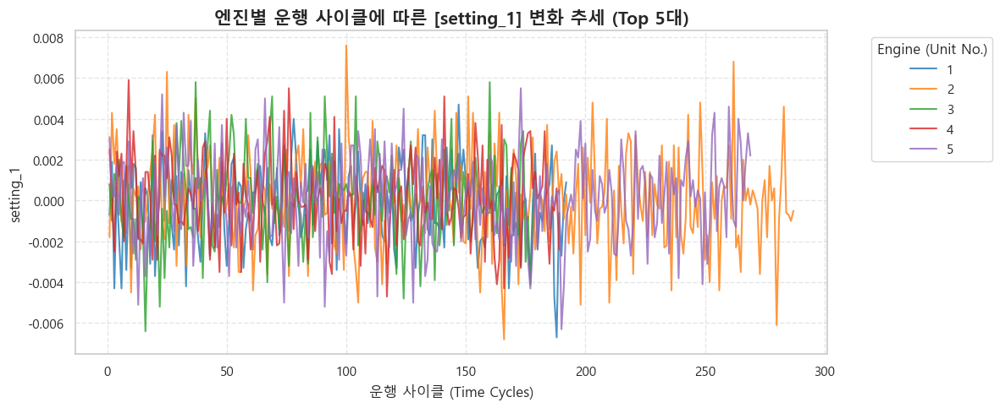

In [137]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_engine_trend(df, target_col='setting_1', num_engines=5):
    """
    지정된 개수의 엔진에 대해 특정 컬럼의 사이클별 변화를 선 그래프로 시각화합니다. ㅋ
    """
    plt.figure(figsize=(12, 5))
    
    # 시각화할 엔진 번호 추출 (처음 num_engines 개)
    engine_ids = df['unit_nr'].unique()[:num_engines]
    sample_df = df[df['unit_nr'].isin(engine_ids)]
    
    # 선 그래프 그리기
    sns.lineplot(data=sample_df, x='time_cycles', y=target_col, 
                 hue='unit_nr', palette='tab10', linewidth=1.5, alpha=0.8)
    
    plt.title(f'엔진별 운행 사이클에 따른 [{target_col}] 변화 추세 (Top {num_engines}대)', fontsize=15, fontweight='bold')
    plt.xlabel('운행 사이클 (Time Cycles)', fontsize=12)
    plt.ylabel(target_col, fontsize=12)
    
    # 범례 위치 조정 (그래프 밖으로)
    plt.legend(title='Engine (Unit No.)', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

# 🚀 df_TRAIN1 데이터셋을 넣어서 바로 실행!
plot_engine_trend(df_TRAIN1, target_col='setting_1', num_engines=5)

# 만약 핵심 센서인 s_11도 어떻게 변하는지 보고 싶다면 아래 주석을 풀고 실행하세요 ㅋ
#plot_engine_trend(df_TRAIN1, target_col='s_11', num_engines=5)

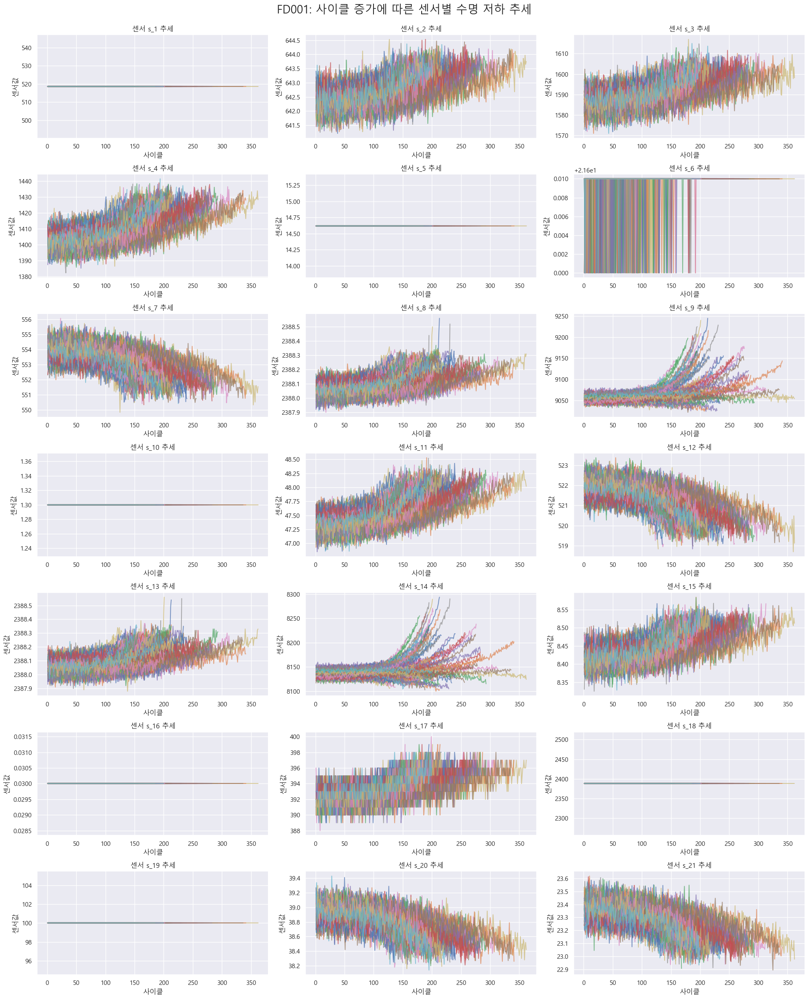

In [72]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# 1. 한글 폰트 및 스타일 설정
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False
sns.set_theme(style="darkgrid", font='Malgun Gothic')

# 3. 센서 컬럼 리스트
sensor_names = ['s_{}'.format(i) for i in range(1, 22)]

# 4. 시각화 (7행 3열 구조로 21개 센서 표시)
fig, axes = plt.subplots(7, 3, figsize=(20, 25))
axes = axes.flatten()

# 모든 엔진을 다 그리면 너무 복잡하므로, 샘플로 몇 개의 엔진만 선택해서 그립니다.
sample_units = df_TRAIN1['unit_nr'].unique()  # 상위 5개 엔진만 샘플링

for i, sensor in enumerate(sensor_names):
    for unit in sample_units:
        unit_data = df_TRAIN1[df_TRAIN1['unit_nr'] == unit]
        axes[i].plot(unit_data['time_cycles'], unit_data[sensor], alpha=0.7, label=f'Unit {unit}')
    
    axes[i].set_title(f'센서 {sensor} 추세', fontsize=12)
    axes[i].set_xlabel('사이클')
    axes[i].set_ylabel('센서값')

# 레이아웃 조정 및 출력
plt.tight_layout()
plt.subplots_adjust(top=0.95)
fig.suptitle('FD001: 사이클 증가에 따른 센서별 수명 저하 추세', fontsize=20)
plt.show()

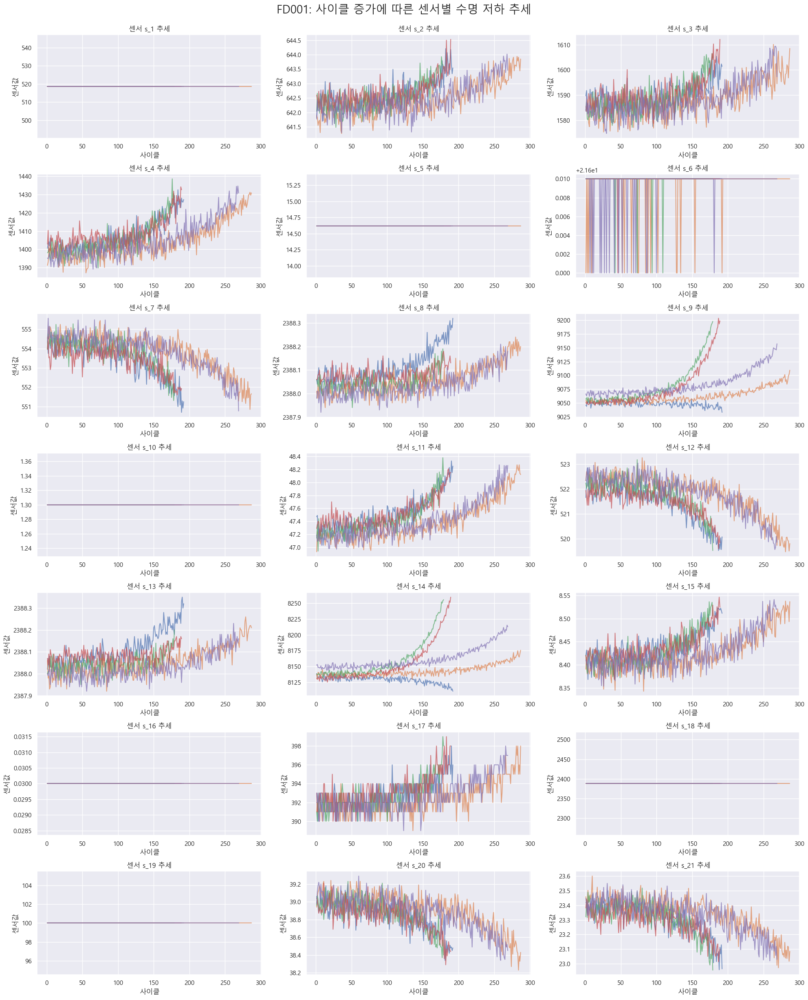

In [73]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# 1. 한글 폰트 및 스타일 설정
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False
sns.set_theme(style="darkgrid", font='Malgun Gothic')

# 3. 센서 컬럼 리스트
sensor_names = ['s_{}'.format(i) for i in range(1, 22)]

# 4. 시각화 (7행 3열 구조로 21개 센서 표시)
fig, axes = plt.subplots(7, 3, figsize=(20, 25))
axes = axes.flatten()

# 모든 엔진을 다 그리면 너무 복잡하므로, 샘플로 몇 개의 엔진만 선택해서 그립니다.
sample_units = df_TRAIN1['unit_nr'].unique()[:5]  # 상위 5개 엔진만 샘플링

for i, sensor in enumerate(sensor_names):
    for unit in sample_units:
        unit_data = df_TRAIN1[df_TRAIN1['unit_nr'] == unit]
        axes[i].plot(unit_data['time_cycles'], unit_data[sensor], alpha=0.7, label=f'Unit {unit}')
    
    axes[i].set_title(f'센서 {sensor} 추세', fontsize=12)
    axes[i].set_xlabel('사이클')
    axes[i].set_ylabel('센서값')

# 레이아웃 조정 및 출력
plt.tight_layout()
plt.subplots_adjust(top=0.95)
fig.suptitle('FD001: 사이클 증가에 따른 센서별 수명 저하 추세', fontsize=20)
plt.show()

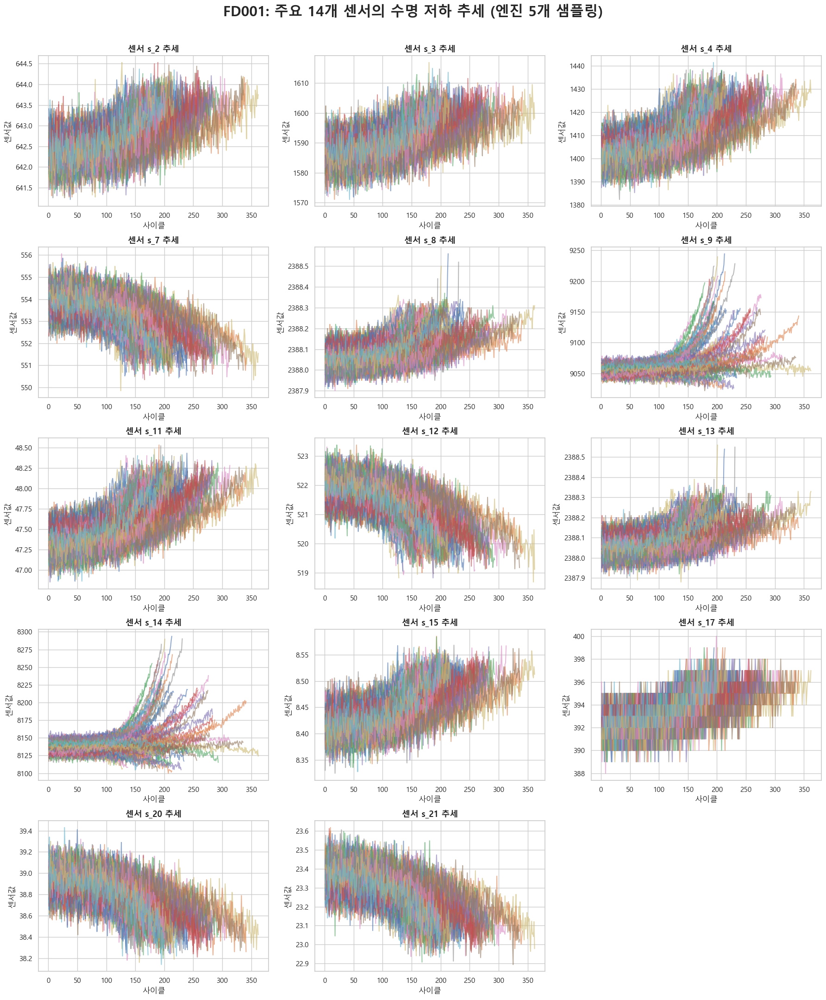

In [74]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. 한글 폰트 및 스타일 설정
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False
sns.set_theme(style="whitegrid", font='Malgun Gothic') # darkgrid보다 추세선이 잘 보이는 whitegrid 추천 ㅋ

# 2. 선택된 14개 센서 리스트 (사용자님 리스트 기준)
sensor_names = ['s_2', 's_3', 's_4', 's_7', 's_8', 's_9', 's_11', 
                's_12', 's_13', 's_14', 's_15', 's_17', 's_20', 's_21']

# 3. 시각화 구조 변경 (5행 3열 = 총 15칸, 14개 센서에 딱 맞음 ㅋ)
fig, axes = plt.subplots(5, 3, figsize=(18, 22))
axes = axes.flatten()

# 모든 엔진을 그리면 너무 복잡하므로 상위 5개 엔진만 샘플링 ㅋ
sample_units = df_TRAIN1['unit_nr'].unique()

for i, sensor in enumerate(sensor_names):
    for unit in sample_units:
        unit_data = df_TRAIN1[df_TRAIN1['unit_nr'] == unit]
        axes[i].plot(unit_data['time_cycles'], unit_data[sensor], alpha=0.6, label=f'Unit {unit}')
    
    axes[i].set_title(f'센서 {sensor} 추세', fontsize=13, fontweight='bold')
    axes[i].set_xlabel('사이클')
    axes[i].set_ylabel('센서값')

# 15번째 빈 칸(마지막 칸)은 안 보이게 숨기기 ㅋ
axes[-1].axis('off')

# 레이아웃 조정 및 출력
plt.tight_layout()
plt.subplots_adjust(top=0.93)
fig.suptitle('FD001: 주요 14개 센서의 수명 저하 추세 (엔진 5개 샘플링)', fontsize=22, fontweight='bold')
plt.show()

In [75]:
# 1. 각 엔진(unit_nr)별로 최대 사이클(수명)을 구합니다.
max_cycle = df_TRAIN1.groupby('unit_nr')['time_cycles'].transform('max')

# 2. 원본 선형 RUL 계산 (최대 사이클 - 현재 사이클)
df_TRAIN1['RUL_raw'] = max_cycle - df_TRAIN1['time_cycles']

# 3. 125 캡 적용된 RUL 계산
df_TRAIN1['RUL_capped'] = df_TRAIN1['RUL_raw'].clip(upper=125)

print("✅ RUL 컬럼 생성 완료!")
print(df_TRAIN1[['unit_nr', 'time_cycles', 'RUL_raw', 'RUL_capped']].head())

✅ RUL 컬럼 생성 완료!
   unit_nr  time_cycles  RUL_raw  RUL_capped
0        1            1      191         125
1        1            2      190         125
2        1            3      189         125
3        1            4      188         125
4        1            5      187         125


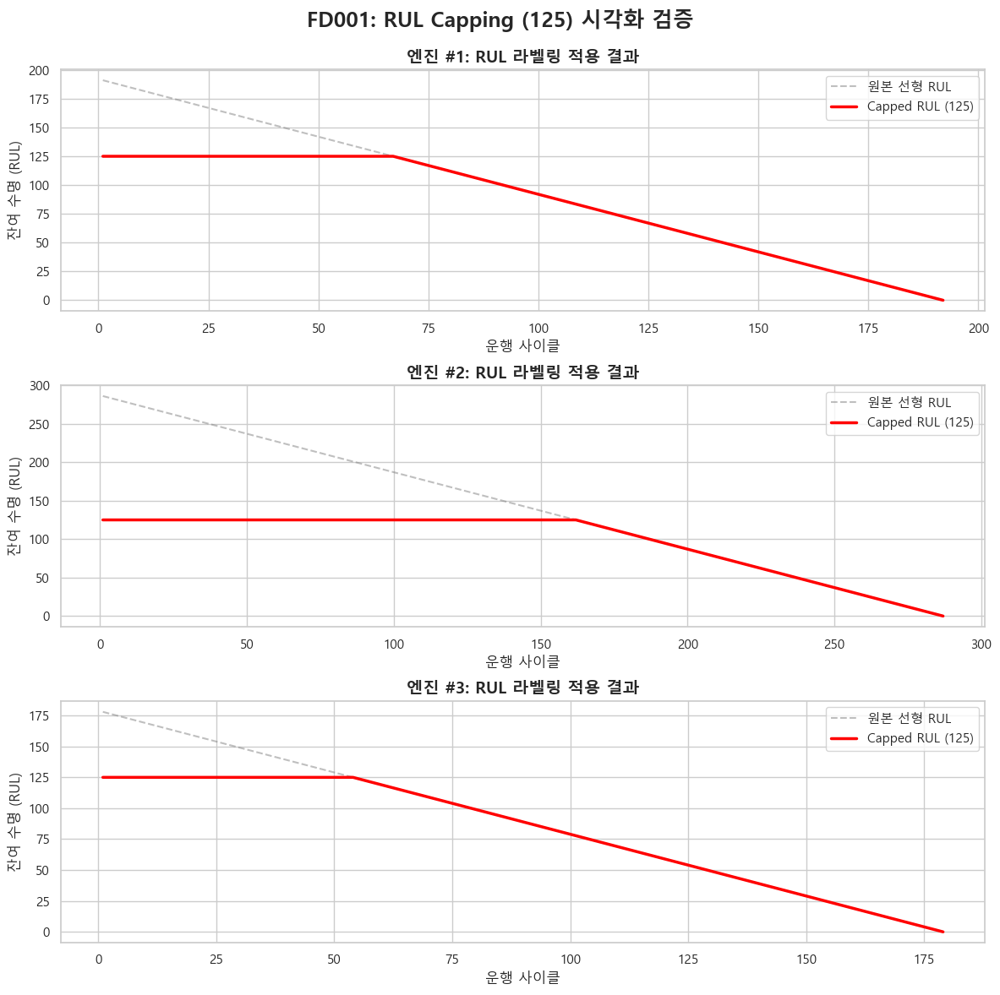

In [76]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. 시각화 설정
plt.rcParams['font.family'] = 'Malgun Gothic'
sns.set_theme(style="whitegrid", font='Malgun Gothic')

# 2. 샘플 엔진 선택 (상위 3개 엔진만 비교 ㅋ)
sample_units = df_TRAIN1['unit_nr'].unique()[:3]

# 3. 그래프 그리기 (엔진별로 한 줄씩)
fig, axes = plt.subplots(len(sample_units), 1, figsize=(12, 12))

for i, unit in enumerate(sample_units):
    unit_data = df_TRAIN1[df_TRAIN1['unit_nr'] == unit]
    
    # 원본 선형 RUL (점선)
    axes[i].plot(unit_data['time_cycles'], unit_data['RUL_raw'], 
                 label='원본 선형 RUL', color='gray', linestyle='--', alpha=0.5)
    
    # 125 캡이 적용된 RUL (실제 학습용 타겟)
    axes[i].plot(unit_data['time_cycles'], unit_data['RUL_capped'], 
                 label='Capped RUL (125)', color='red', lw=2.5)
    
    axes[i].set_title(f'엔진 #{unit}: RUL 라벨링 적용 결과', fontsize=14, fontweight='bold')
    axes[i].set_xlabel('운행 사이클')
    axes[i].set_ylabel('잔여 수명 (RUL)')
    axes[i].legend(loc='upper right')

plt.tight_layout()
plt.subplots_adjust(top=0.92)
fig.suptitle('FD001: RUL Capping (125) 시각화 검증', fontsize=18, fontweight='bold')
plt.show()

In [77]:
from scipy.ndimage import gaussian_filter1d

# 노이즈를 제거할 센서 리스트 (주요 센서 14개)
sensor_names = ['s_2', 's_3', 's_4', 's_7', 's_8', 's_9', 's_11', 
                's_12', 's_13', 's_14', 's_15', 's_17', 's_20', 's_21']

# 필터 강도 설정 (보통 2.0이 적당합니다 ㅋ)
sigma = 2.0

# 원본 데이터를 보존하면서 스무딩된 데이터를 저장할 데이터프레임 복사
df_SMOOTH = df_TRAIN1.copy()

# 엔진별(unit_nr)로 그룹화하여 각 센서에 가우시안 필터 적용
for sensor in sensor_names:
    df_SMOOTH[sensor] = df_TRAIN1.groupby('unit_nr')[sensor].transform(lambda x: gaussian_filter1d(x, sigma=sigma))

print("✅ 가우시안 스무딩 적용 완료!")

✅ 가우시안 스무딩 적용 완료!


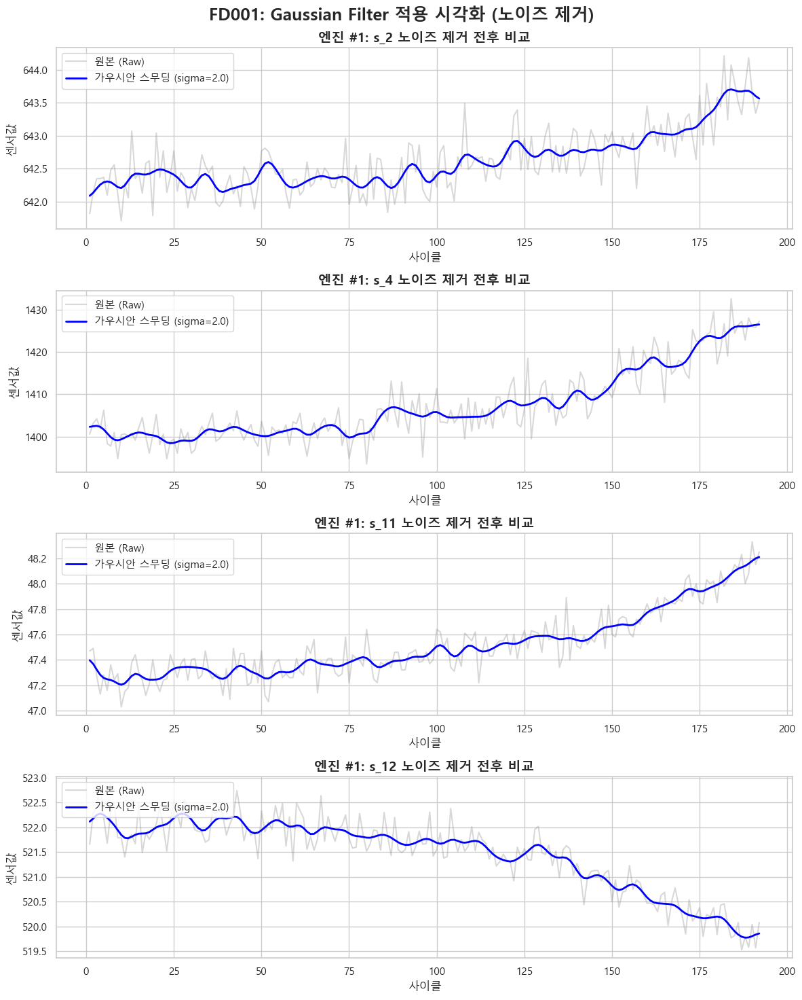

In [78]:
import matplotlib.pyplot as plt
import seaborn as sns

# 시각화 설정
plt.rcParams['font.family'] = 'Malgun Gothic'
sns.set_theme(style="whitegrid", font='Malgun Gothic')

# 시각화할 샘플 센서 선택 (예: s_2, s_4, s_11, s_12)
sample_sensors = ['s_2', 's_4', 's_11', 's_12']
unit_id = 1  # 1번 엔진 기준

fig, axes = plt.subplots(len(sample_sensors), 1, figsize=(12, 15))

for i, sensor in enumerate(sample_sensors):
    # 원본 데이터 (회색 점선)
    axes[i].plot(df_TRAIN1[df_TRAIN1['unit_nr']==unit_id]['time_cycles'], 
                 df_TRAIN1[df_TRAIN1['unit_nr']==unit_id][sensor], 
                 color='gray', alpha=0.3, label='원본 (Raw)')
    
    # 가우시안 스무딩 데이터 (파란색 실선)
    axes[i].plot(df_SMOOTH[df_SMOOTH['unit_nr']==unit_id]['time_cycles'], 
                 df_SMOOTH[df_SMOOTH['unit_nr']==unit_id][sensor], 
                 color='blue', lw=2, label=f'가우시안 스무딩 (sigma={sigma})')
    
    axes[i].set_title(f'엔진 #{unit_id}: {sensor} 노이즈 제거 전후 비교', fontsize=14, fontweight='bold')
    axes[i].set_xlabel('사이클')
    axes[i].set_ylabel('센서값')
    axes[i].legend(loc='upper left')

plt.tight_layout()
plt.subplots_adjust(top=0.94)
fig.suptitle('FD001: Gaussian Filter 적용 시각화 (노이즈 제거)', fontsize=18, fontweight='bold')
plt.show()

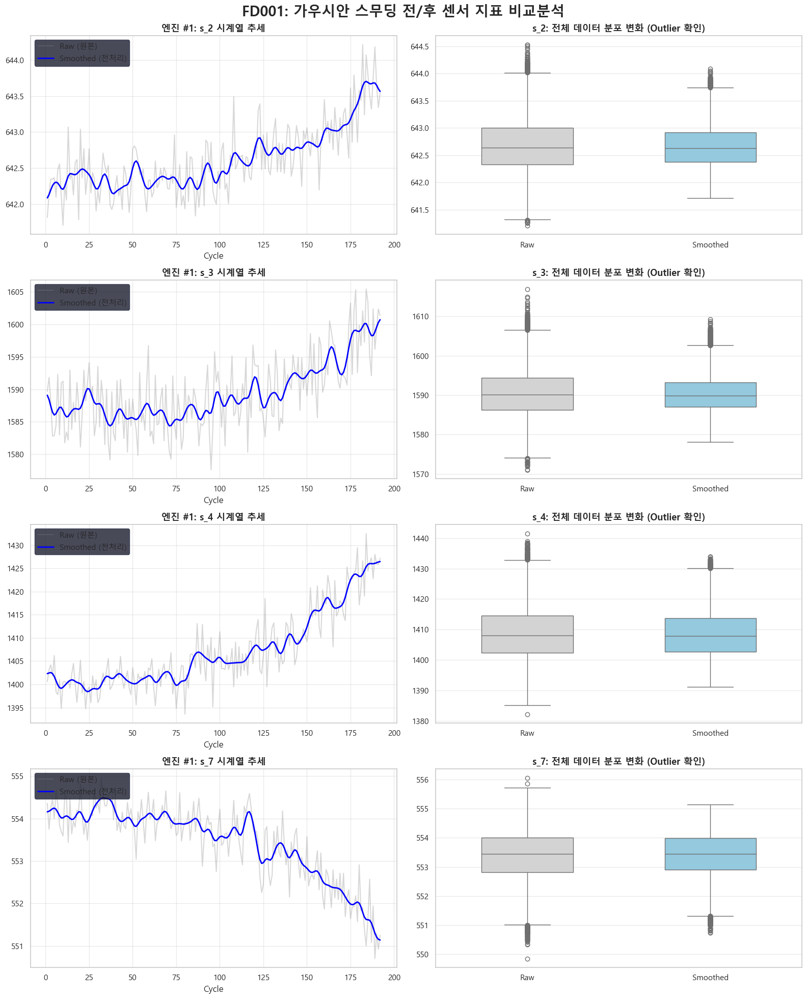

In [155]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. 시각화 설정 (한글 깨짐 방지 ㅋ)
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False
sns.set_theme(style="whitegrid", font='Malgun Gothic')

# 분석할 핵심 센서 14개
sensor_names = ['s_2', 's_3', 's_4', 's_7', 's_8', 's_9', 's_11', 
                's_12', 's_13', 's_14', 's_15', 's_17', 's_20', 's_21']

# 시각화할 샘플 엔진 
unit_id = 1

# 2. 14개 센서 전체 시각화 루프 ㅋ
# (양이 많으니 여기서는 상위 4개만 예시로 보여주거나, 루프 범위를 조절하세요 ㅋ)
plot_sensors = sensor_names[:4] # 예시로 4개만 출력, 전체를 보려면 sensor_names로 변경 ㅋ

fig, axes = plt.subplots(len(plot_sensors), 2, figsize=(16, 5 * len(plot_sensors)))

for i, sensor in enumerate(plot_sensors):
    # --- 왼쪽: 시계열 추세 비교 (이미지 스타일) ㅋ ---
    axes[i, 0].plot(df_TRAIN1[df_TRAIN1['unit_nr']==unit_id]['time_cycles'], 
                    df_TRAIN1[df_TRAIN1['unit_nr']==unit_id][sensor], 
                    color='gray', alpha=0.3, label='Raw (원본)')
    axes[i, 0].plot(df_SMOOTH[df_SMOOTH['unit_nr']==unit_id]['time_cycles'], 
                    df_SMOOTH[df_SMOOTH['unit_nr']==unit_id][sensor], 
                    color='blue', lw=2, label='Smoothed (전처리)')
    axes[i, 0].set_title(f'엔진 #{unit_id}: {sensor} 시계열 추세', fontsize=13, fontweight='bold')
    axes[i, 0].set_xlabel('Cycle')
    axes[i, 0].legend(loc='upper left')

    # --- 오른쪽: 분포 비교 (박스플롯 추가 ㅋ) ---
    # 데이터 재구성: Raw와 Smoothed를 비교하기 위해 melt ㅋ
    compare_df = pd.DataFrame({
        'Raw': df_TRAIN1[sensor],
        'Smoothed': df_SMOOTH[sensor]
    })
    sns.boxplot(data=compare_df, ax=axes[i, 1], palette=['lightgray', 'skyblue'], width=0.5)
    axes[i, 1].set_title(f'{sensor}: 전체 데이터 분포 변화 (Outlier 확인)', fontsize=13, fontweight='bold')

plt.tight_layout()
plt.subplots_adjust(top=0.95)
fig.suptitle('FD001: 가우시안 스무딩 전/후 센서 지표 비교분석', fontsize=20, fontweight='bold')
plt.show()

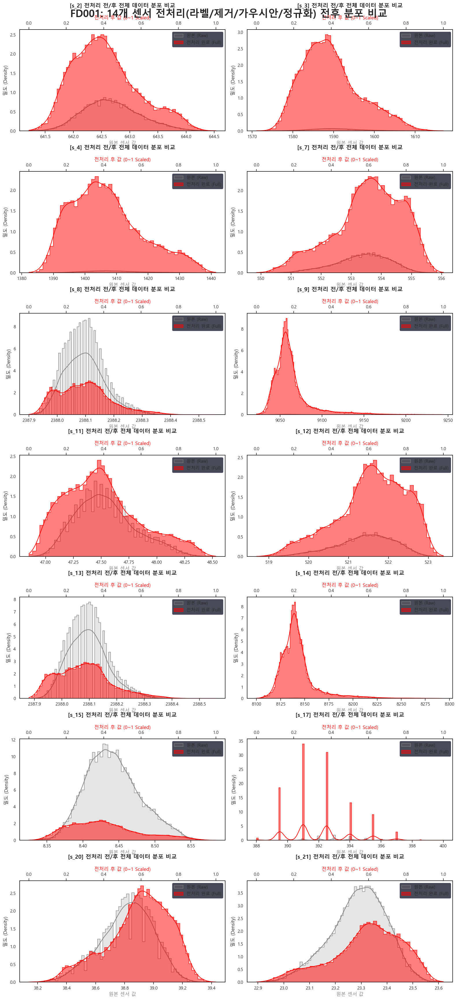

In [160]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. 시각화 설정
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False
sns.set_theme(style="white", font='Malgun Gothic')

# 분석 대상 14개 센서
sensor_names = ['s_2', 's_3', 's_4', 's_7', 's_8', 's_9', 's_11', 
                's_12', 's_13', 's_14', 's_15', 's_17', 's_20', 's_21']

# 2. 14개 센서 히스토그램 시각화 (7행 2열)
fig, axes = plt.subplots(7, 2, figsize=(16, 35))
axes = axes.flatten()

for i, sensor in enumerate(sensor_names):
    # --- 전처리 전 (df_TRAIN1: 원본 스케일) ---
    ax2 = axes[i].twiny() # 스케일이 다르므로 상단 보조축 활용 ㅋ
    sns.histplot(df_TRAIN1[sensor], color='gray', label='원본 (Raw)', 
                 kde=True, stat="density", alpha=0.2, ax=axes[i], element="step")
    axes[i].set_xlabel('원본 센서 값', color='gray')
    
    # --- 전처리 후 (df_ml_train: 정규화/스무딩 완료 스케일 0~1) ---
    sns.histplot(df_FINAL[sensor], color='red', label='전처리 완료 (Full)', 
                 kde=True, stat="density", alpha=0.5, ax=ax2, element="step")
    ax2.set_xlabel('전처리 후 값 (0~1 Scaled)', color='red')
    
    axes[i].set_title(f'[{sensor}] 전처리 전/후 전체 데이터 분포 비교', fontsize=14, fontweight='bold', pad=20)
    axes[i].set_ylabel('밀도 (Density)')
    
    # 범례 합치기 ㅋ
    lines, labels = axes[i].get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax2.legend(lines + lines2, labels + labels2, loc='upper right')

plt.tight_layout()
plt.subplots_adjust(top=0.96, hspace=0.4)
fig.suptitle('FD001: 14개 센서 전처리(라벨/제거/가우시안/정규화) 전후 분포 비교', fontsize=25, fontweight='bold')

plt.show()

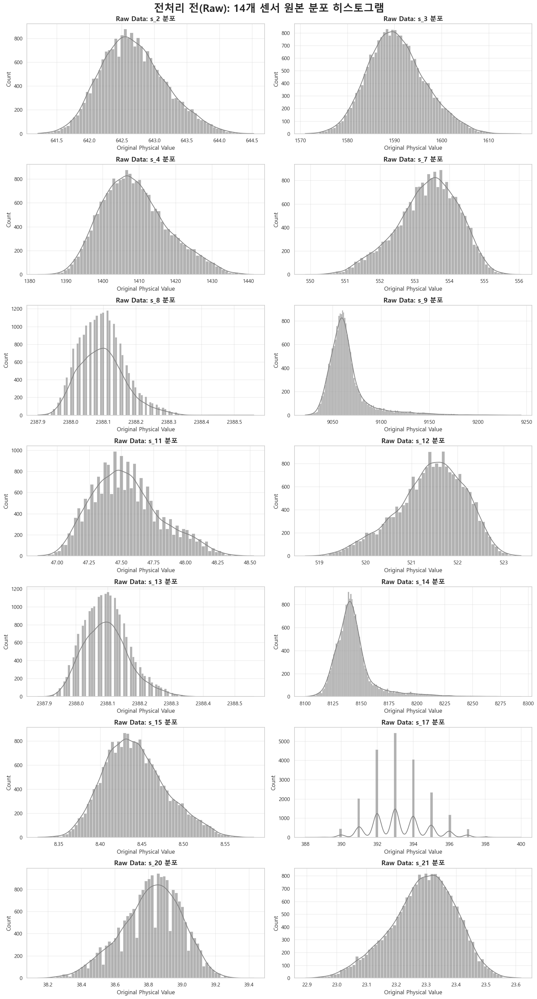

In [161]:
import matplotlib.pyplot as plt
import seaborn as sns

# 시각화 설정
plt.rcParams['font.family'] = 'Malgun Gothic'
sns.set_theme(style="whitegrid", font='Malgun Gothic')

# 14개 센서 리스트
sensor_names = ['s_2', 's_3', 's_4', 's_7', 's_8', 's_9', 's_11', 
                's_12', 's_13', 's_14', 's_15', 's_17', 's_20', 's_21']

# --- [SET 1] 전처리 전 원본 분포 히스토그램 ---
fig, axes = plt.subplots(7, 2, figsize=(16, 30))
axes = axes.flatten()

for i, sensor in enumerate(sensor_names):
    sns.histplot(df_TRAIN1[sensor], color='gray', kde=True, ax=axes[i], alpha=0.6)
    axes[i].set_title(f'Raw Data: {sensor} 분포', fontsize=14, fontweight='bold')
    axes[i].set_xlabel('Original Physical Value')
    axes[i].set_ylabel('Count')

plt.tight_layout()
plt.subplots_adjust(top=0.96)
fig.suptitle('전처리 전(Raw): 14개 센서 원본 분포 히스토그램', fontsize=22, fontweight='bold')
plt.show()

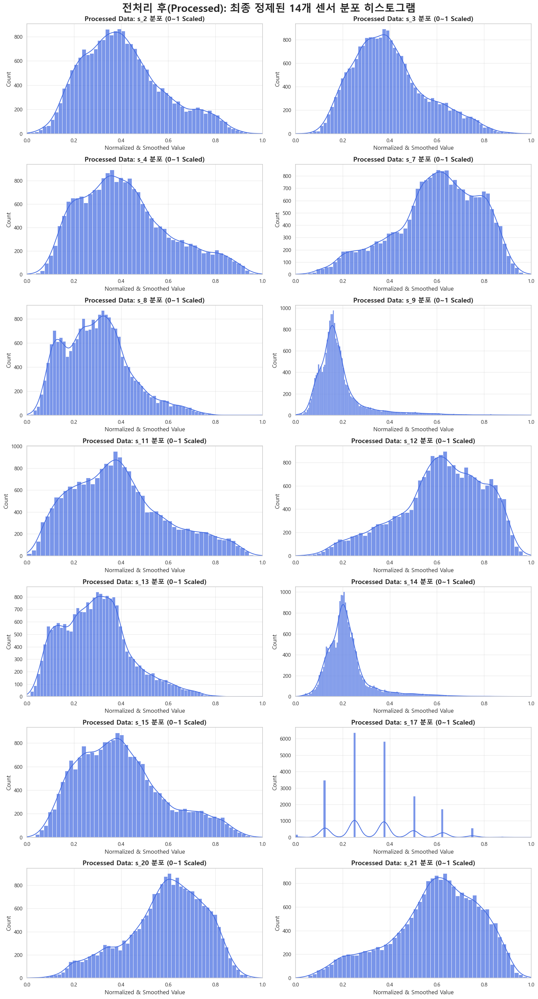

In [163]:
# --- [SET 2] 전처리 후 최종 분포 히스토그램 ---
fig, axes = plt.subplots(7, 2, figsize=(16, 30))
axes = axes.flatten()

for i, sensor in enumerate(sensor_names):
    # 전처리 완료된 데이터셋 (df_ml_train) 사용 ㅋ
    sns.histplot(df_FINAL[sensor], color='royalblue', kde=True, ax=axes[i], alpha=0.7)
    
    # x축을 0~1 사이로 고정하여 정규화 확인 ㅋ
    axes[i].set_xlim(0, 1)
    axes[i].set_title(f'Processed Data: {sensor} 분포 (0~1 Scaled)', fontsize=14, fontweight='bold')
    axes[i].set_xlabel('Normalized & Smoothed Value')
    axes[i].set_ylabel('Count')

plt.tight_layout()
plt.subplots_adjust(top=0.96)
fig.suptitle('전처리 후(Processed): 최종 정제된 14개 센서 분포 히스토그램', fontsize=22, fontweight='bold')
plt.show()

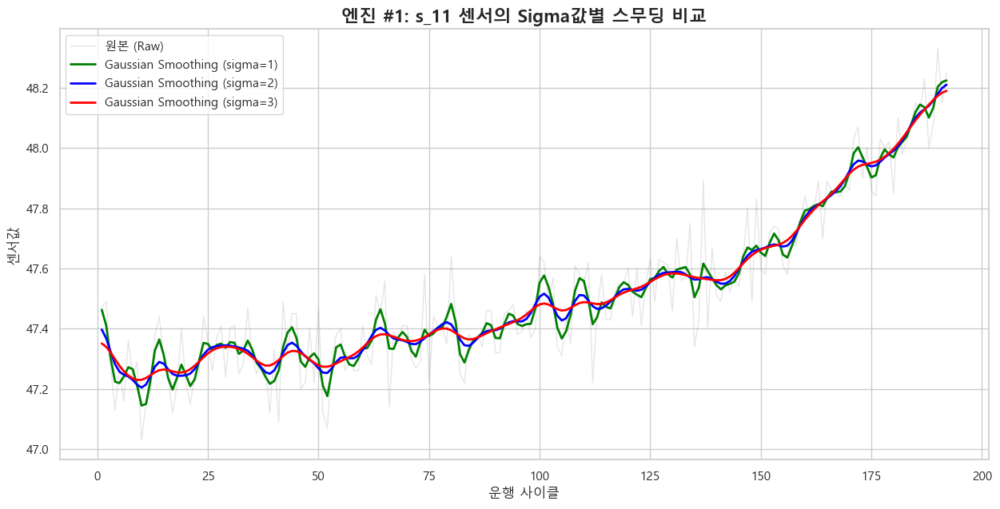

In [79]:
from scipy.ndimage import gaussian_filter1d
import matplotlib.pyplot as plt
import seaborn as sns

# 1. 시각화 설정
plt.rcParams['font.family'] = 'Malgun Gothic'
sns.set_theme(style="whitegrid", font='Malgun Gothic')

# 2. 분석할 센서와 엔진 선택 (변화가 큰 s_11 추천 ㅋ)
sensor_to_plot = 's_11'
unit_id = 1
unit_data = df_TRAIN1[df_TRAIN1['unit_nr'] == unit_id]

# 3. 그래프 그리기
plt.figure(figsize=(15, 7))

# 원본 데이터 (바탕)
plt.plot(unit_data['time_cycles'], unit_data[sensor_to_plot], 
         color='gray', alpha=0.2, label='원본 (Raw)', lw=1)

# Sigma 1, 2, 3 적용 및 시각화
colors = ['green', 'blue', 'red']
sigmas = [1, 2, 3]

for s, color in zip(sigmas, colors):
    smoothed = gaussian_filter1d(unit_data[sensor_to_plot], sigma=s)
    plt.plot(unit_data['time_cycles'], smoothed, 
             color=color, lw=2, label=f'Gaussian Smoothing (sigma={s})')

# 그래프 꾸미기
plt.title(f'엔진 #{unit_id}: {sensor_to_plot} 센서의 Sigma값별 스무딩 비교', fontsize=16, fontweight='bold')
plt.xlabel('운행 사이클')
plt.ylabel('센서값')
plt.legend(loc='best', fontsize=11)
plt.show()

In [80]:
from sklearn.preprocessing import MinMaxScaler

# 1. 정규화 대상 센서 리스트
sensor_names = ['s_2', 's_3', 's_4', 's_7', 's_8', 's_9', 's_11', 
                's_12', 's_13', 's_14', 's_15', 's_17', 's_20', 's_21']

# 2. 스케일러 생성 및 적용 (df_SMOOTH 데이터를 기반으로 진행합니다 ㅋ)
scaler = MinMaxScaler()
df_FINAL = df_SMOOTH.copy()

# 센서 데이터만 추출해서 0~1 사이로 변환
df_FINAL[sensor_names] = scaler.fit_transform(df_SMOOTH[sensor_names])

print("✅ Min-Max 정규화 완료!")
print(f"변환 후 데이터 범위: {df_FINAL[sensor_names].min().min()} ~ {df_FINAL[sensor_names].max().max()}")

✅ Min-Max 정규화 완료!
변환 후 데이터 범위: 0.0 ~ 1.0


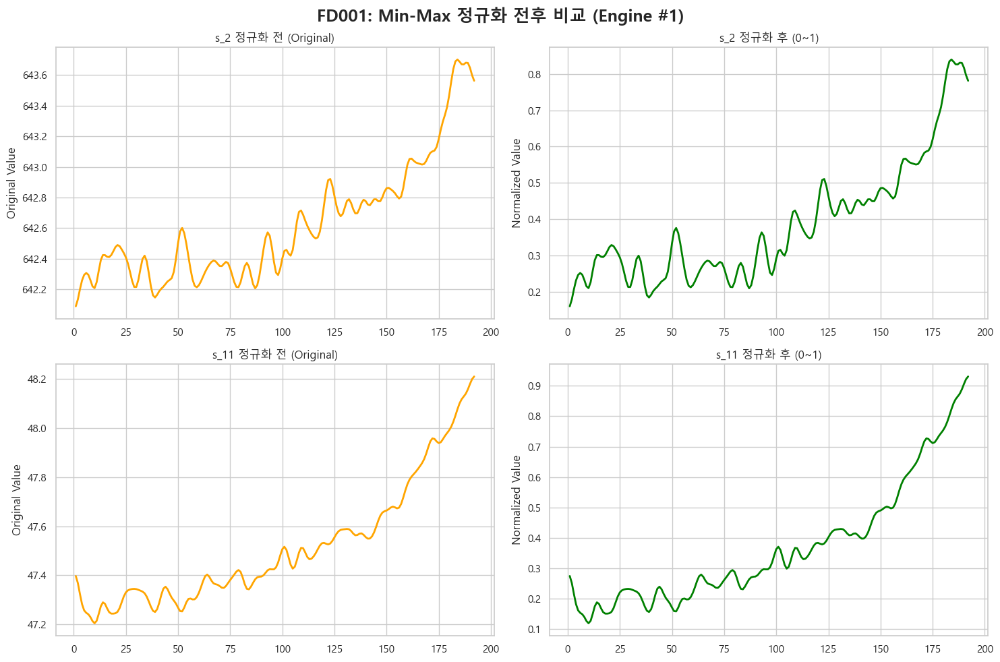

In [81]:
import matplotlib.pyplot as plt
import seaborn as sns

# 시각화 설정
plt.rcParams['font.family'] = 'Malgun Gothic'
sns.set_theme(style="whitegrid", font='Malgun Gothic')

# 비교할 센서 2개 선택 (스케일 차이가 큰 s_2와 s_11 ㅋ)
target_sensors = ['s_2', 's_11']
unit_id = 1

fig, axes = plt.subplots(2, 2, figsize=(15, 10))

for i, sensor in enumerate(target_sensors):
    # [왼쪽] 정규화 전 (Original Scale)
    axes[i, 0].plot(df_SMOOTH[df_SMOOTH['unit_nr']==unit_id]['time_cycles'], 
                    df_SMOOTH[df_SMOOTH['unit_nr']==unit_id][sensor], color='orange', lw=2)
    axes[i, 0].set_title(f'{sensor} 정규화 전 (Original)', fontsize=12)
    axes[i, 0].set_ylabel('Original Value')
    
    # [오른쪽] 정규화 후 (0~1 Scale)
    axes[i, 1].plot(df_FINAL[df_FINAL['unit_nr']==unit_id]['time_cycles'], 
                    df_FINAL[df_FINAL['unit_nr']==unit_id][sensor], color='green', lw=2)
    axes[i, 1].set_title(f'{sensor} 정규화 후 (0~1)', fontsize=12)
    axes[i, 1].set_ylabel('Normalized Value')

plt.tight_layout()
plt.subplots_adjust(top=0.92)
fig.suptitle('FD001: Min-Max 정규화 전후 비교 (Engine #1)', fontsize=18, fontweight='bold')
plt.show()

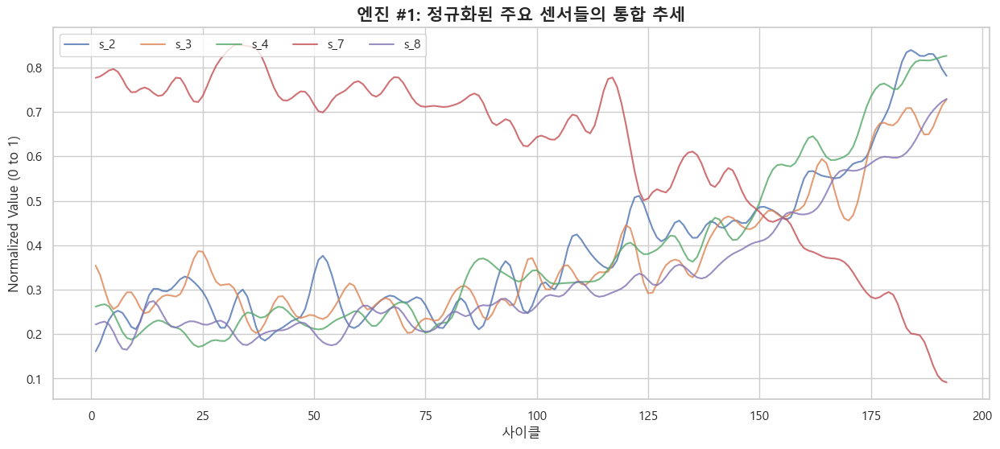

In [82]:
plt.figure(figsize=(15, 6))

# 상위 5개 센서만 뽑아서 한꺼번에 그려보기 ㅋ
for sensor in sensor_names[:5]:
    plt.plot(df_FINAL[df_FINAL['unit_nr']==unit_id]['time_cycles'], 
             df_FINAL[df_FINAL['unit_nr']==unit_id][sensor], label=sensor, alpha=0.8)

plt.title(f'엔진 #{unit_id}: 정규화된 주요 센서들의 통합 추세', fontsize=15, fontweight='bold')
plt.xlabel('사이클')
plt.ylabel('Normalized Value (0 to 1)')
plt.legend(loc='upper left', ncol=5)
plt.show()

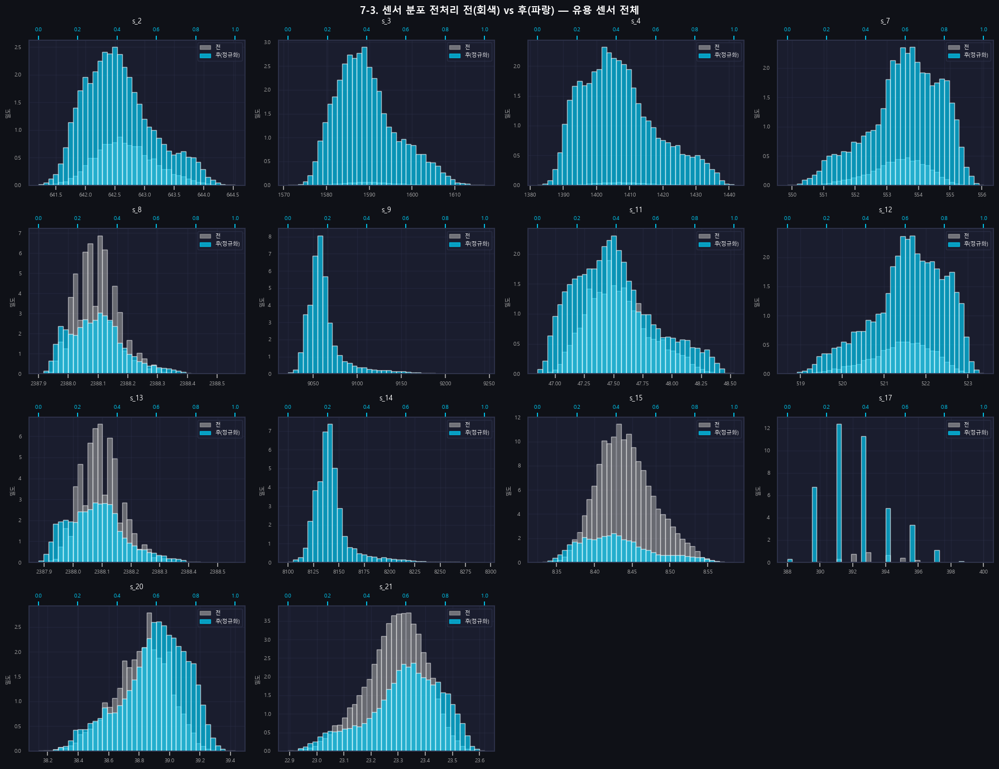

In [154]:
n_cols = 4
n_rows = (len(USEFUL_SENSORS)+n_cols-1)//n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, n_rows*3.5))
fig.suptitle('7-3. 센서 분포 전처리 전(회색) vs 후(파랑) — 유용 센서 전체', fontsize=13, fontweight='bold')

for ax, s in zip(axes.flat, USEFUL_SENSORS):
    before_data = df_TRAIN1[s]
    after_data  = df_FINAL[s]
    # 정규화된 값이라 x축 스케일이 다름 → 별도 정규화
    ax2 = ax.twiny()
    ax.hist(before_data, bins=40, color=GRAY,  alpha=0.55, density=True, label='전처리 전')
    ax2.hist(after_data, bins=40, color=C[0], alpha=0.65, density=True, label='전처리 후')
    ax.set_title(f'{s}', fontsize=9)
    ax.set_ylabel('밀도', fontsize=7)
    ax.tick_params(labelsize=7)
    ax2.tick_params(labelsize=7, colors=C[0])
    handles = [mpatches.Patch(color=GRAY, alpha=0.6, label='전'),
               mpatches.Patch(color=C[0], alpha=0.7, label='후(정규화)')] 
    ax.legend(handles=handles, fontsize=7, loc='upper right')

for ax in axes.flat[len(USEFUL_SENSORS):]:
    ax.set_visible(False)

plt.tight_layout(); plt.show()

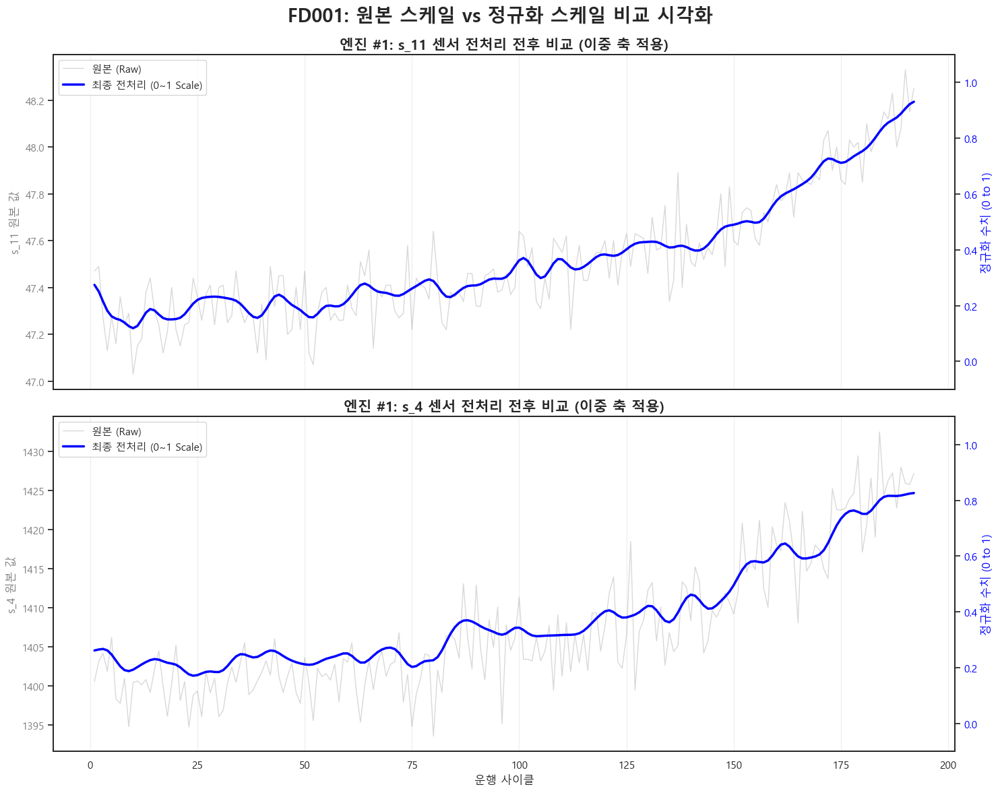

In [83]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. 시각화 설정
plt.rcParams['font.family'] = 'Malgun Gothic'
sns.set_theme(style="white", font='Malgun Gothic') # 이중 축은 격자가 너무 많으면 복잡해서 white 추천 ㅋ

# 2. 비교할 샘플 센서와 엔진 선택
target_sensors = ['s_11', 's_4']
unit_id = 1
unit_raw = df_TRAIN1[df_TRAIN1['unit_nr'] == unit_id]
unit_final = df_FINAL[df_FINAL['unit_nr'] == unit_id]

# 3. 그래프 그리기
fig, axes = plt.subplots(2, 1, figsize=(15, 12), sharex=True)

for i, sensor in enumerate(target_sensors):
    # [왼쪽 Y축] 원본 데이터 (Raw)
    lns1 = axes[i].plot(unit_raw['time_cycles'], unit_raw[sensor], 
                         color='gray', alpha=0.3, label='원본 (Raw)', lw=1)
    axes[i].set_ylabel(f'{sensor} 원본 값', color='gray', fontsize=12)
    axes[i].tick_params(axis='y', labelcolor='gray')
    
    # [오른쪽 Y축 생성] 정규화 데이터 (0~1)
    ax2 = axes[i].twinx() 
    lns2 = ax2.plot(unit_final['time_cycles'], unit_final[sensor], 
                     color='blue', lw=2.5, label='최종 전처리 (0~1 Scale)')
    ax2.set_ylabel('정규화 수치 (0 to 1)', color='blue', fontsize=12)
    ax2.tick_params(axis='y', labelcolor='blue')
    ax2.set_ylim(-0.1, 1.1) # 0~1 범위를 명확하게 고정 ㅋ
    
    # 범례 합치기 (이중 축이라 그냥 부르면 따로 나옴 ㅋ)
    lns = lns1 + lns2
    labs = [l.get_label() for l in lns]
    axes[i].legend(lns, labs, loc='upper left')
    
    axes[i].set_title(f'엔진 #{unit_id}: {sensor} 센서 전처리 전후 비교 (이중 축 적용)', fontsize=15, fontweight='bold')
    axes[i].grid(True, axis='x', alpha=0.3) # X축 격자만 표시해서 깔끔하게

axes[1].set_xlabel('운행 사이클')
plt.tight_layout()
plt.subplots_adjust(top=0.92)
fig.suptitle('FD001: 원본 스케일 vs 정규화 스케일 비교 시각화', fontsize=20, fontweight='bold')
plt.show()

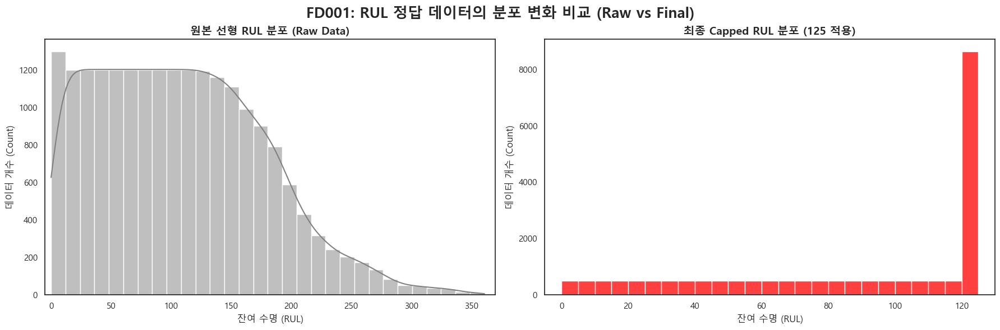

In [84]:
# 1. 그래프 그리기 (1행 2열 구조)
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# [왼쪽] 원본 선형 RUL 분포 (Raw)
sns.histplot(df_FINAL['RUL_raw'], kde=True, color='gray', ax=axes[0], bins=30)
axes[0].set_title('원본 선형 RUL 분포 (Raw Data)', fontsize=14, fontweight='bold')
axes[0].set_xlabel('잔여 수명 (RUL)')
axes[0].set_ylabel('데이터 개수 (Count)')
axes[0].set_xlim(-5, 370)  # FD001 최대 수명 고려 ㅋ

# [오른쪽] Capped RUL 분포 (125)
sns.histplot(df_FINAL['RUL_capped'], kde=False, color='red', ax=axes[1], bins=25)
axes[1].set_title('최종 Capped RUL 분포 (125 적용)', fontsize=14, fontweight='bold')
axes[1].set_xlabel('잔여 수명 (RUL)')
axes[1].set_ylabel('데이터 개수 (Count)')
axes[1].set_xlim(-5, 130)

plt.tight_layout()
plt.subplots_adjust(top=0.88)
fig.suptitle('FD001: RUL 정답 데이터의 분포 변화 비교 (Raw vs Final)', fontsize=19, fontweight='bold')
plt.show()

In [85]:
# Train에서 사용했던 센서 리스트 (주요 14개)
sensor_names = ['s_2', 's_3', 's_4', 's_7', 's_8', 's_9', 's_11', 
                's_12', 's_13', 's_14', 's_15', 's_17', 's_20', 's_21']

# 상수 센서 및 설정값 제거
df_test_proc = df_TEST1.drop(columns=['setting_1', 'setting_2', 'setting_3'] + 
                            [c for c in df_TEST1.columns if c.startswith('s_') and c not in sensor_names])

In [86]:
from scipy.ndimage import gaussian_filter1d

# 테스트 데이터도 엔진별로 그룹화하여 스무딩 적용
for sensor in sensor_names:
    df_test_proc[sensor] = df_test_proc.groupby('unit_nr')[sensor].transform(lambda x: gaussian_filter1d(x, sigma=2.0))

In [87]:
# 주의: 새로운 scaler를 fit하면 안 됩니다! ㅋ
# 이미 만들어둔 scaler(MinMaxScaler)를 그대로 사용하여 transform만 수행
df_test_final = df_test_proc.copy()
df_test_final[sensor_names] = scaler.transform(df_test_proc[sensor_names])

print("✅ 테스트 데이터 전처리 완료!")
print(df_test_final[sensor_names].head())

✅ 테스트 데이터 전처리 완료!
        s_2       s_3       s_4       s_7       s_8       s_9      s_11  \
0  0.309629  0.268721  0.180675  0.797290  0.154360  0.120702  0.242202   
1  0.298443  0.262992  0.194078  0.795470  0.152782  0.118935  0.245081   
2  0.283807  0.249531  0.213610  0.790109  0.149668  0.115479  0.243192   
3  0.270582  0.228592  0.230263  0.780766  0.146398  0.111553  0.231479   
4  0.256934  0.206230  0.241074  0.769573  0.146282  0.109235  0.213268   

       s_12      s_13      s_14      s_15   s_17      s_20      s_21  
0  0.742181  0.174142  0.155001  0.183737  0.250  0.749758  0.789379  
1  0.741171  0.175993  0.155628  0.190414  0.250  0.759629  0.791455  
2  0.740399  0.179921  0.155630  0.199328  0.125  0.768945  0.792418  
3  0.742545  0.186316  0.154291  0.206559  0.125  0.768288  0.789294  
4  0.749451  0.194723  0.152402  0.212443  0.125  0.758999  0.782460  


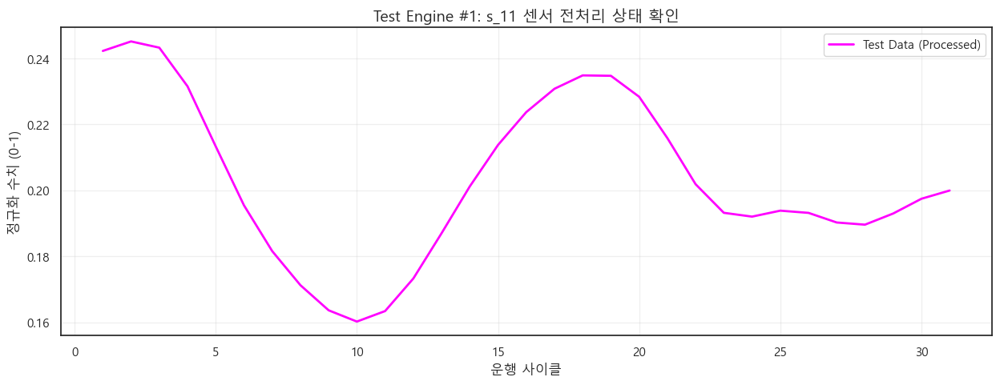

In [88]:
import matplotlib.pyplot as plt

# 테스트 세트의 1번 엔진 상태 확인
unit_id_test = 1
test_sample = df_test_final[df_test_final['unit_nr'] == unit_id_test]

plt.figure(figsize=(15, 5))

# 테스트 데이터의 s_11 센서 추세 (정규화 완료된 상태)
plt.plot(test_sample['time_cycles'], test_sample['s_11'], color='magenta', lw=2, label='Test Data (Processed)')
plt.title(f'Test Engine #{unit_id_test}: s_11 센서 전처리 상태 확인', fontsize=14)
plt.xlabel('운행 사이클')
plt.ylabel('정규화 수치 (0-1)')
plt.grid(True, alpha=0.3)
plt.legend()
plt.show()

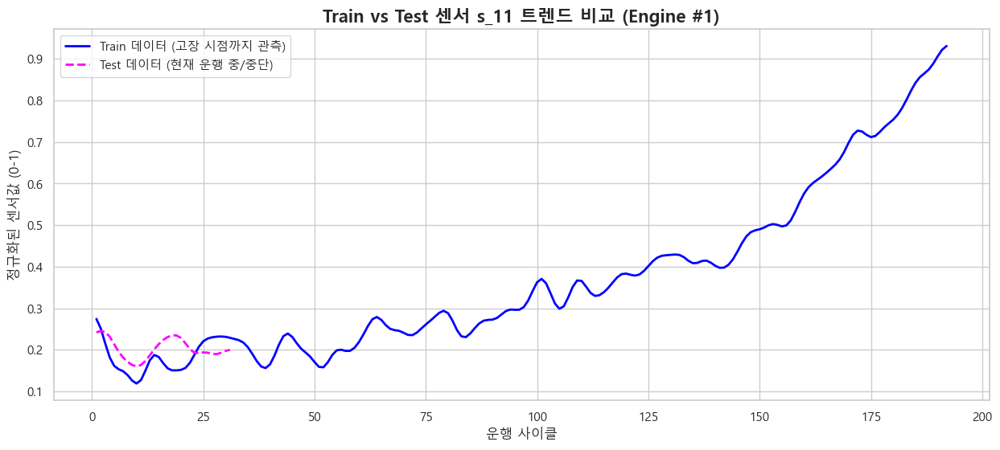

In [89]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. 스타일 설정
plt.rcParams['font.family'] = 'Malgun Gothic'
sns.set_theme(style="whitegrid", font='Malgun Gothic')

# 2. 비교 대상 선정 (Train 1번 엔진 vs Test 1번 엔진)
# Test 데이터는 고장 직전 어느 시점에서 멈춰있는 상태입니다 ㅋ
sensor_to_compare = 's_11'
train_unit = df_FINAL[df_FINAL['unit_nr'] == 1]
test_unit = df_test_final[df_test_final['unit_nr'] == 1]

fig, ax = plt.subplots(figsize=(15, 6))

# Train 데이터 시각화
ax.plot(train_unit['time_cycles'], train_unit[sensor_to_compare], 
        color='blue', lw=2, label='Train 데이터 (고장 시점까지 관측)')

# Test 데이터 시각화
ax.plot(test_unit['time_cycles'], test_unit[sensor_to_compare], 
        color='magenta', lw=2, linestyle='--', label='Test 데이터 (현재 운행 중/중단)')

ax.set_title(f'Train vs Test 센서 {sensor_to_compare} 트렌드 비교 (Engine #1)', fontsize=16, fontweight='bold')
ax.set_xlabel('운행 사이클')
ax.set_ylabel('정규화된 센서값 (0-1)')
ax.legend(loc='upper left')

plt.show()

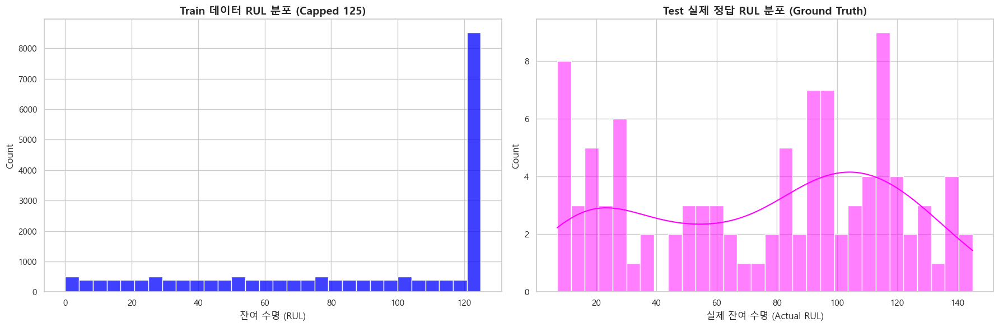

In [90]:
# 1. 그래프 구조 생성
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# [왼쪽] Train RUL 분포 (Capped 125)
sns.histplot(df_FINAL['RUL_capped'], kde=False, color='blue', ax=axes[0], bins=30)
axes[0].set_title('Train 데이터 RUL 분포 (Capped 125)', fontsize=14, fontweight='bold')
axes[0].set_xlabel('잔여 수명 (RUL)')

# [오른쪽] Test 실제 정답 RUL 분포 (RUL_FD001.txt)
sns.histplot(df_RUL1['RUL'], kde=True, color='magenta', ax=axes[1], bins=30)
axes[1].set_title('Test 실제 정답 RUL 분포 (Ground Truth)', fontsize=14, fontweight='bold')
axes[1].set_xlabel('실제 잔여 수명 (Actual RUL)')

plt.tight_layout()
plt.show()

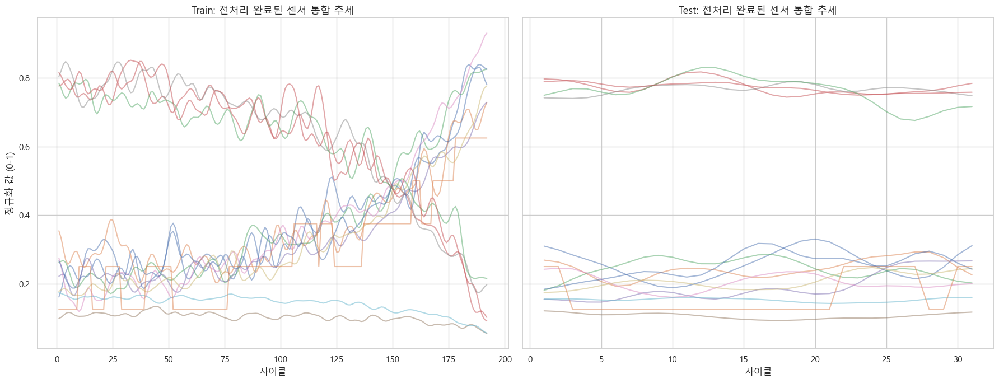

In [91]:
fig, axes = plt.subplots(1, 2, figsize=(18, 7), sharey=True)

# Train 데이터 (모든 센서)
for sensor in sensor_names:
    axes[0].plot(train_unit['time_cycles'], train_unit[sensor], alpha=0.5)
axes[0].set_title('Train: 전처리 완료된 센서 통합 추세', fontsize=13)
axes[0].set_xlabel('사이클')
axes[0].set_ylabel('정규화 값 (0-1)')

# Test 데이터 (모든 센서)
for sensor in sensor_names:
    axes[1].plot(test_unit['time_cycles'], test_unit[sensor], alpha=0.5)
axes[1].set_title('Test: 전처리 완료된 센서 통합 추세', fontsize=13)
axes[1].set_xlabel('사이클')

plt.tight_layout()
plt.show()

[가설 검정] s_11: RUL 80% 시점 vs 20% 시점의 센서값 변화율 비교
[귀무가설] 잔여수명 20% 남았을 때와 잔여수명이 80% 남았을 때와 센서값 평균 변화율은 같다
----------------------------------------------------------------------


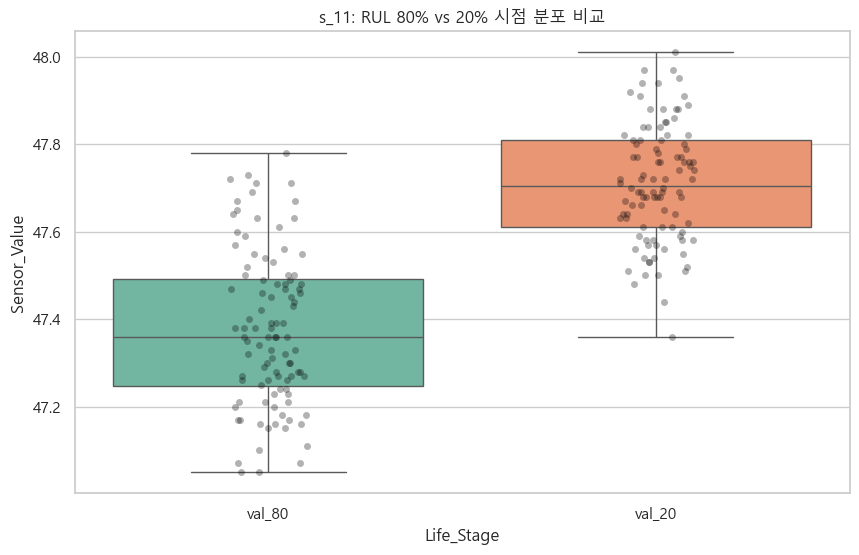

 정규성 검정(차잇값): 통과 (p-val: 8.4529e-01)
 등분산성 검정: 불통과 (p-val: 5.4175e-03)

검정 방법: Paired T-test (대응표본 t-검정)
통계량: 22.7266, p-value: 4.5451e-41

[결과] 귀무가설 기각! RUL 80%와 20% 시점의 센서값은 통계적으로 유의미한 차이가 있습니다. ㅋ
   - 80% 시점 대비 20% 시점에서 평균적으로 0.3339만큼 센서값이 증가했습니다.
   - 효과 크기(Cohen's d): 2.2727 (매우 강한 열화 신호)
----------------------------------------------------------------------


In [145]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import shapiro, levene, ttest_rel, wilcoxon

def analyze_life_stage_diff(df, target_sensor='s_11'):
    print(f"[가설 검정] {target_sensor}: RUL 80% 시점 vs 20% 시점의 센서값 변화율 비교")
    print(f"[귀무가설] 잔여수명 20% 남았을 때와 잔여수명이 80% 남았을 때와 센서값 평균 변화율은 같다")
    print("-" * 70)

    # 1. 엔진별 80%, 20% 시점 데이터 추출 ㅋ
    paired_data = []
    units = df['unit_nr'].unique()
    
    for unit in units:
        engine_data = df[df['unit_nr'] == unit].sort_values('time_cycles')
        max_cycle = engine_data['time_cycles'].max()
        
        # 80% 남은 시점 (초기 근처)와 20% 남은 시점 (말기 근처) ㅋ
        # RUL_raw 기준 혹은 cycle 비율 기준으로 추출
        idx_80 = engine_data.iloc[(engine_data['time_cycles'] - max_cycle * 0.2).abs().argsort()[:1]]
        idx_20 = engine_data.iloc[(engine_data['time_cycles'] - max_cycle * 0.8).abs().argsort()[:1]]
        
        if not idx_80.empty and not idx_20.empty:
            paired_data.append({
                'unit_nr': unit,
                'val_80': idx_80[target_sensor].values[0],
                'val_20': idx_20[target_sensor].values[0]
            })
    
    df_paired = pd.DataFrame(paired_data)
    diff = df_paired['val_20'] - df_paired['val_80'] # 변화량

    # 2. 시각화 (두 시점 비교)
    plt.figure(figsize=(10, 6))
    df_melt = df_paired.melt(id_vars='unit_nr', value_vars=['val_80', 'val_20'], 
                             var_name='Life_Stage', value_name='Sensor_Value')
    sns.boxplot(x='Life_Stage', y='Sensor_Value', data=df_melt, palette='Set2')
    sns.stripplot(x='Life_Stage', y='Sensor_Value', data=df_melt, color='black', alpha=0.3)
    plt.title(f'{target_sensor}: RUL 80% vs 20% 시점 분포 비교')
    plt.show()

    # 3. 정규성 검정 (차잇값의 정규성 확인) ㅋ
    # 대응표본은 '두 집단의 차이(diff)'가 정규분포를 따르는지가 중요합니다.
    stat_norm, p_norm = shapiro(diff)
    is_normal = p_norm > 0.05
    print(f" 정규성 검정(차잇값): {'통과' if is_normal else '불통과'} (p-val: {p_norm:.4e})")

    # 4. 등분산성 검정 (참고용)
    stat_lev, p_lev = levene(df_paired['val_80'], df_paired['val_20'])
    is_equal_var = p_lev > 0.05
    print(f" 등분산성 검정: {'통과' if is_equal_var else '불통과'} (p-val: {p_lev:.4e})")

    # 5. 본 검정 (대응표본 t-test vs Wilcoxon) ㅋ
    if is_normal:
        stat, p_val = ttest_rel(df_paired['val_20'], df_paired['val_80'])
        method = "Paired T-test (대응표본 t-검정)"
    else:
        stat, p_val = wilcoxon(df_paired['val_20'], df_paired['val_80'])
        method = "Wilcoxon Signed-Rank Test (비모수 대응표본 검정)"

    print(f"\n검정 방법: {method}")
    print(f"통계량: {stat:.4f}, p-value: {p_val:.4e}")

    # 6. 결과 해석 및 사후 분석 느낌의 요약 ㅋ
    if p_val < 0.05:
        print(f"\n[결과] 귀무가설 기각! RUL 80%와 20% 시점의 센서값은 통계적으로 유의미한 차이가 있습니다. ㅋ")
        avg_diff = diff.mean()
        print(f"   - 80% 시점 대비 20% 시점에서 평균적으로 {avg_diff:.4f}만큼 센서값이 {'증가' if avg_diff > 0 else '감소'}했습니다.")
        
        # 사후검정 성격의 효과 크기(Cohen's d) 계산 ㅋ
        cohen_d = diff.mean() / diff.std()
        print(f"   - 효과 크기(Cohen's d): {abs(cohen_d):.4f} ({'매우 강한' if abs(cohen_d) > 0.8 else '보통의'} 열화 신호)")
    else:
        print("\n[결과] 귀무가설 채택. 두 시점 간의 센서값 차이가 우연일 가능성이 높습니다.")

    print("-" * 70)

# 🚀 df_ml_train 데이터셋으로 실행! (가장 변별력 좋은 s_11 센서 추천 ㅋ)
analyze_life_stage_diff(df_TRAIN1, target_sensor='s_11')

🚀 총 14개 센서에 대한 수명 단계별(80% vs 20%) 통계 검정 시작...


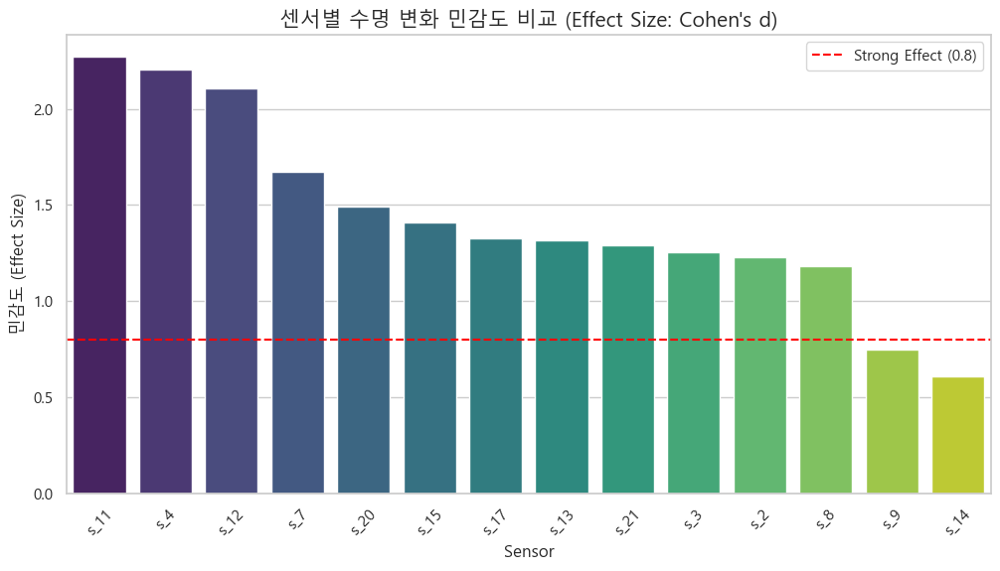

,Sensor,Method,P-Value,Avg_Diff,Cohen_d,Significant
6,s_11,Paired T-test,4.545101e-41,0.333900,2.272657,Yes
2,s_4,Paired T-test,5.261544e-40,11.809100,2.206452,Yes
7,s_12,Paired T-test,2.311361e-38,-0.995400,2.106728,Yes
3,s_7,Paired T-test,1.480568e-30,-1.010300,1.670074,Yes
12,s_20,Paired T-test,4.174814e-27,-0.207600,1.493586,Yes
10,s_15,Paired T-test,2.228149e-25,0.041738,1.408273,Yes
11,s_17,Wilcoxon,7.385731e-15,1.720000,1.327648,Yes
8,s_13,Wilcoxon,4.484363e-15,0.072400,1.316036,Yes
13,s_21,Paired T-test,6.050667e-23,-0.119637,1.290957,Yes
1,s_3,Paired T-test,3.296174e-22,7.127500,1.256047,Yes


In [146]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import shapiro, ttest_rel, wilcoxon

def batch_stat_test(df, sensor_list):
    print(f"🚀 총 {len(sensor_list)}개 센서에 대한 수명 단계별(80% vs 20%) 통계 검정 시작...")
    print("=" * 80)
    
    results = []
    units = df['unit_nr'].unique()
    
    # 1. 14개 센서별 루프 ㅋ
    for sensor in sensor_list:
        paired_data = []
        for unit in units:
            engine_data = df[df['unit_nr'] == unit].sort_values('time_cycles')
            max_cycle = engine_data['time_cycles'].max()
            
            # 80%, 20% 시점 추출 (정확히 일치하는 사이클이 없을 수 있어 가장 가까운 값 선택) ㅋ
            idx_80 = engine_data.iloc[(engine_data['time_cycles'] - max_cycle * 0.2).abs().argsort()[:1]]
            idx_20 = engine_data.iloc[(engine_data['time_cycles'] - max_cycle * 0.8).abs().argsort()[:1]]
            
            if not idx_80.empty and not idx_20.empty:
                paired_data.append({
                    'val_80': idx_80[sensor].values[0],
                    'val_20': idx_20[sensor].values[0]
                })
        
        df_p = pd.DataFrame(paired_data)
        diff = df_p['val_20'] - df_p['val_80']
        
        # 2. 정규성 검정 ㅋ
        _, p_norm = shapiro(diff)
        
        # 3. 대응표본 검정 (정규성 여부에 따라 분기) ㅋ
        if p_norm > 0.05:
            _, p_val = ttest_rel(df_p['val_20'], df_p['val_80'])
            method = "Paired T-test"
        else:
            _, p_val = wilcoxon(df_p['val_20'], df_p['val_80'])
            method = "Wilcoxon"
            
        # 4. 효과 크기(Cohen's d) 계산 - 차이의 강도를 수치화 ㅋ
        cohen_d = diff.mean() / diff.std() if diff.std() != 0 else 0
        
        results.append({
            'Sensor': sensor,
            'Method': method,
            'P-Value': p_val,
            'Avg_Diff': diff.mean(),
            'Cohen_d': abs(cohen_d),
            'Significant': 'Yes' if p_val < 0.05 else 'No'
        })

    # 5. 결과 요약 및 시각화 ㅋ
    res_df = pd.DataFrame(results).sort_values(by='Cohen_d', ascending=False)
    
    # 효과 크기 시각화
    plt.figure(figsize=(12, 6))
    sns.barplot(data=res_df, x='Sensor', y='Cohen_d', palette='viridis')
    plt.axhline(0.8, color='red', linestyle='--', label='Strong Effect (0.8)')
    plt.title('센서별 수명 변화 민감도 비교 (Effect Size: Cohen\'s d)', fontsize=15)
    plt.ylabel('민감도 (Effect Size)')
    plt.xticks(rotation=45)
    plt.legend()
    plt.show()
    
    return res_df

# 🚀 14개 센서 리스트 정의 (팀원분이 선별하신 센서 컬럼명으로 수정 가능 ㅋ)
selected_14_sensors = ['s_2', 's_3', 's_4', 's_7', 's_8', 's_9', 's_11', 
                       's_12', 's_13', 's_14', 's_15', 's_17', 's_20', 's_21']

# 실행!
stat_summary = batch_stat_test(df_TRAIN1, selected_14_sensors)
display(stat_summary)

In [92]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

# 1. 고유한 엔진 ID 목록 가져오기
unit_ids = df_FINAL['unit_nr'].unique()

# 2. 엔진 ID를 기준으로 8:2 분리 (재현성을 위해 random_state 고정 ㅋ)
train_units, val_units = train_test_split(unit_ids, test_size=0.2, random_state=42)

# 3. 분리된 ID에 해당하는 데이터 추출
df_ml_train = df_FINAL[df_FINAL['unit_nr'].isin(train_units)]
df_ml_val = df_FINAL[df_FINAL['unit_nr'].isin(val_units)]

print(f"✅ 엔진 분리 완료: 학습용 {len(train_units)}개, 검증용 {len(val_units)}개")

✅ 엔진 분리 완료: 학습용 80개, 검증용 20개


In [93]:
# 사용하기로 했던 14개 주요 센서 리스트
sensor_names = ['s_2', 's_3', 's_4', 's_7', 's_8', 's_9', 's_11', 
                's_12', 's_13', 's_14', 's_15', 's_17', 's_20', 's_21']

# 학습 데이터 분리
X_train = df_ml_train[sensor_names]
y_train = df_ml_train['RUL_capped']

# 검증 데이터 분리
X_val = df_ml_val[sensor_names]
y_val = df_ml_val['RUL_capped']

# 테스트 데이터 (최종 평가용)
X_test = df_test_final[sensor_names]
# 테스트 정답은 엔진별 '마지막 시점'의 예측값과 비교하므로, 일단 전체 피처만 준비합니다. ㅋ

print(f"📊 최종 데이터셋 크기:")
print(f" - X_train: {X_train.shape}, y_train: {y_train.shape}")
print(f" - X_val: {X_val.shape}, y_val: {y_val.shape}")
print(f" - X_test: {X_test.shape}")

📊 최종 데이터셋 크기:
 - X_train: (16561, 14), y_train: (16561,)
 - X_val: (4070, 14), y_val: (4070,)
 - X_test: (13096, 14)


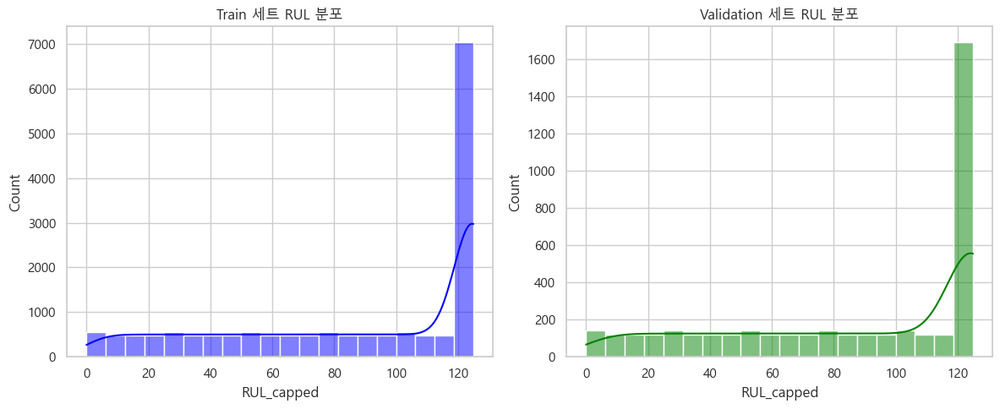

In [94]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.histplot(y_train, color='blue', kde=True, bins=20)
plt.title('Train 세트 RUL 분포')

plt.subplot(1, 2, 2)
sns.histplot(y_val, color='green', kde=True, bins=20)
plt.title('Validation 세트 RUL 분포')

plt.tight_layout()
plt.show()

In [95]:
# 윈도우 크기 설정 (보통 15~20 정도가 적당합니다 ㅋ)
window_size = 15

def add_rolling_features(df, sensors, window):
    df_res = df.copy()
    for s in sensors:
        # 이동평균(Mean) 추가
        df_res[f'{s}_mean'] = df.groupby('unit_nr')[s].transform(lambda x: x.rolling(window, min_periods=1).mean())
        # 이동표준편차(Std) 추가 - 센서의 떨림 정도 파악 ㅋ
        df_res[f'{s}_std'] = df.groupby('unit_nr')[s].transform(lambda x: x.rolling(window, min_periods=1).std().fillna(0))
    return df_res

# 1. 훈련/검증/테스트 데이터에 적용
df_ml_train_roll = add_rolling_features(df_ml_train, sensor_names, window_size)
df_ml_val_roll = add_rolling_features(df_ml_val, sensor_names, window_size)
df_test_final_roll = add_rolling_features(df_test_final, sensor_names, window_size)

# 2. 새로 만들어진 피처 리스트 업데이트
# 원본 센서 + 평균 센서 + 표준편차 센서 총 42개 피처가 됩니다! ㅋ
rolling_sensor_names = [col for col in df_ml_train_roll.columns if 's_' in col]

print(f"✅ Rolling 피처 생성 완료! 총 피처 수: {len(rolling_sensor_names)}개")

✅ Rolling 피처 생성 완료! 총 피처 수: 49개


In [97]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# 1. XGBoost 모델 생성 (회귀용)
# n_estimators: 나무의 개수, learning_rate: 학습 속도, max_depth: 나무 깊이
model_xgb = xgb.XGBRegressor(
    n_estimators=500,
    learning_rate=0.05,
    max_depth=6,
    random_state=42,
    n_jobs=-1
)

# 2. 모델 학습
print("🚀 XGBoost 모델 학습 시작...")
model_xgb.fit(
    X_train_final, y_train_final,
    eval_set=[(X_val_final, y_val_final)],
    verbose=100  # 100번마다 결과 출력 ㅋ
)

print("✅ 학습 완료!")

🚀 XGBoost 모델 학습 시작...
[0]	validation_0-rmse:39.96063
[100]	validation_0-rmse:14.30174
[200]	validation_0-rmse:14.37985
[300]	validation_0-rmse:14.39014
[400]	validation_0-rmse:14.40077
[499]	validation_0-rmse:14.44537
✅ 학습 완료!



📊 검증 세트 종합 결과:
 - RMSE: 14.45 (평균 오차)
 - R2 Score: 0.8801 (결정계수)
 - NASA S-Score: 24064.21 (낮을수록 좋음! ㅋ)


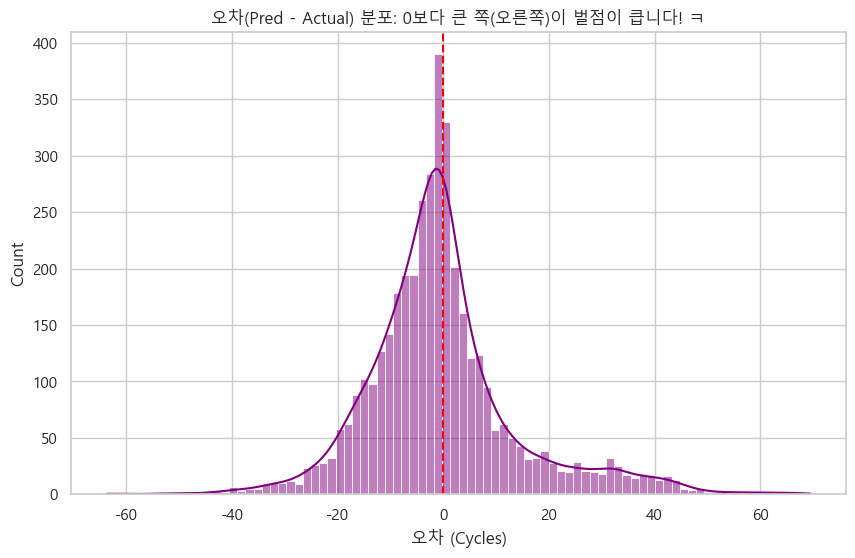

In [98]:
import numpy as np

# 1. NASA S-Score 계산 함수 정의
def calculate_nasa_score(y_true, y_pred):
    d = y_pred - y_true
    score = 0
    for i in d:
        if i < 0: # 조기 예측 (고장이 빨리 올거라고 예측 - 벌점 낮음)
            score += (np.exp(-i / 13) - 1)
        else: # 지연 예측 (고장이 늦게 올거라고 예측 - 벌점 높음 ㅋ)
            score += (np.exp(i / 10) - 1)
    return score

# 2. 검증 데이터 예측 (이미 수행했다면 통과 ㅋ)
y_val_pred = model_xgb.predict(X_val_final)

# 3. 성능 지표 계산
rmse = np.sqrt(mean_squared_error(y_val_final, y_val_pred))
r2 = r2_score(y_val_final, y_val_pred)
nasa_s_score = calculate_nasa_score(y_val_final, y_val_pred)

print(f"\n📊 검증 세트 종합 결과:")
print(f" - RMSE: {rmse:.2f} (평균 오차)")
print(f" - R2 Score: {r2:.4f} (결정계수)")
print(f" - NASA S-Score: {nasa_s_score:.2f} (낮을수록 좋음! ㅋ)")

# 4. 오차 분포 시각화 (NASA 스코어 이해용 ㅋ)
errors = y_val_pred - y_val_final
plt.figure(figsize=(10, 6))
sns.histplot(errors, kde=True, color='purple')
plt.axvline(x=0, color='red', linestyle='--')
plt.title('오차(Pred - Actual) 분포: 0보다 큰 쪽(오른쪽)이 벌점이 큽니다! ㅋ')
plt.xlabel('오차 (Cycles)')
plt.show()

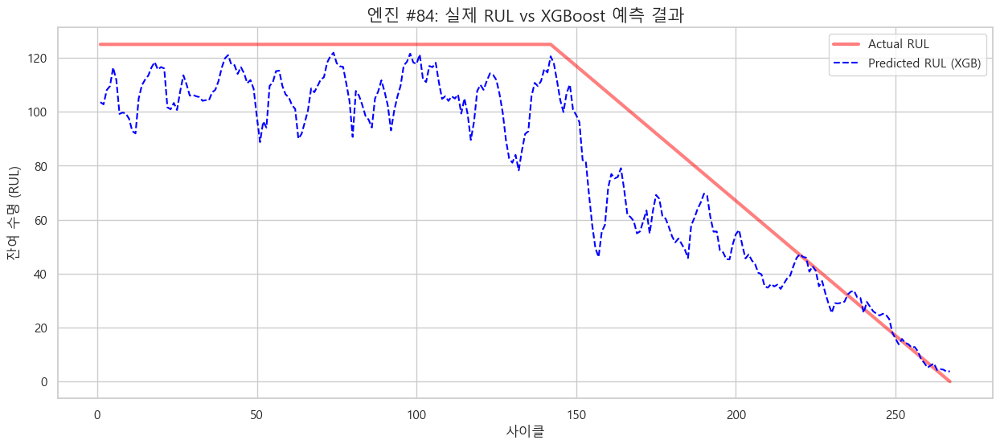

In [99]:
plt.figure(figsize=(15, 6))

# 검증 세트의 한 엔진(샘플) 데이터만 추출해서 흐름 비교
sample_val_unit = val_units[0]
sample_mask = df_ml_val_roll['unit_nr'] == sample_val_unit

plt.plot(df_ml_val_roll[sample_mask]['time_cycles'], y_val_final[sample_mask], 
         label='Actual RUL', color='red', lw=3, alpha=0.5)
plt.plot(df_ml_val_roll[sample_mask]['time_cycles'], y_val_pred[sample_mask], 
         label='Predicted RUL (XGB)', color='blue', linestyle='--')

plt.title(f'엔진 #{sample_val_unit}: 실제 RUL vs XGBoost 예측 결과', fontsize=15)
plt.xlabel('사이클')
plt.ylabel('잔여 수명 (RUL)')
plt.legend()
plt.show()

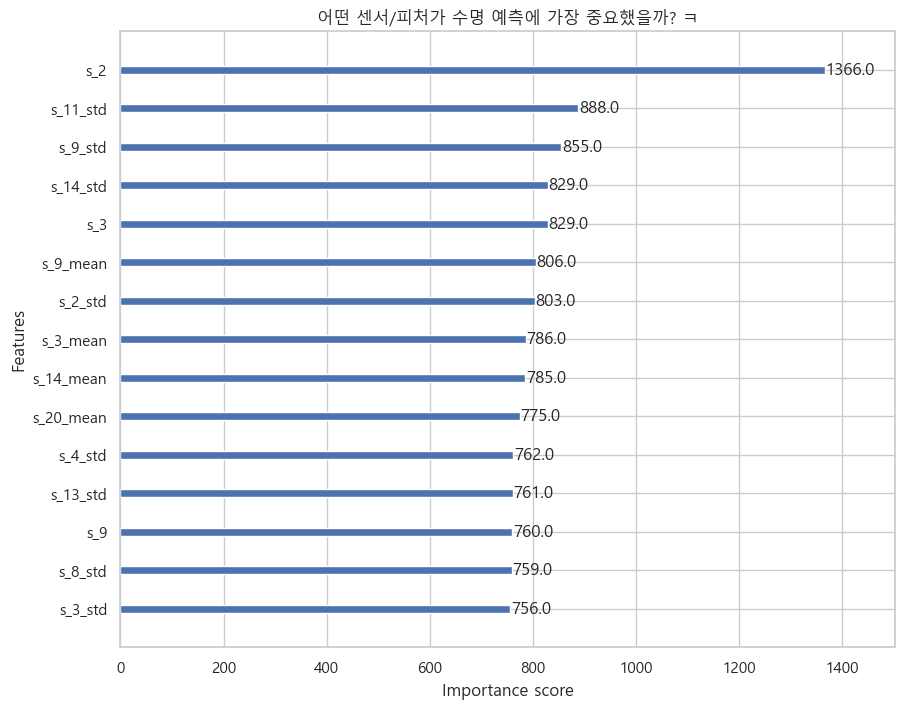

In [100]:
# 피처 중요도 상위 10개 출력
plt.figure(figsize=(10, 8))
xgb.plot_importance(model_xgb, max_num_features=15, ax=plt.gca(), importance_type='weight')
plt.title('어떤 센서/피처가 수명 예측에 가장 중요했을까? ㅋ')
plt.show()

In [102]:
# 1. df_test_final_roll에 실제로 존재하는 컬럼 중에서만 's_'가 포함된 것을 고릅니다.
# 이렇게 하면 삭제된 센서들이 리스트에서 자동으로 빠집니다! ㅋ
rolling_sensor_names = [col for col in df_test_final_roll.columns if 's_' in col]

# 2. 다시 데이터셋 분리 실행
X_train_final = df_ml_train_roll[rolling_sensor_names]
y_train_final = df_ml_train_roll['RUL_capped']
import lightgbm as lgb
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# 1. LightGBM 모델 생성 (회귀용)
model_lgb = lgb.LGBMRegressor(
    n_estimators=1000,
    learning_rate=0.01,
    max_depth=8,
    num_leaves=31,
    random_state=42,
    n_jobs=-1,
    importance_type='gain' # 중요도 계산 방식을 'gain'으로 설정 ㅋ
)

# 2. 모델 학습
print("🚀 LightGBM 모델 학습 시작...")
model_lgb.fit(
    X_train_final, y_train_final,
    eval_set=[(X_val_final, y_val_final)],
    eval_metric='rmse',
    callbacks=[lgb.early_stopping(stopping_rounds=50), lgb.log_evaluation(100)] # 50번 동안 개선 없으면 멈춤 ㅋ
)

# 3. 검증 데이터 예측
y_val_pred_lgb = model_lgb.predict(X_val_final)

# 4. 성능 지표 계산 (NASA Score 포함 ㅋ)
rmse_lgb = np.sqrt(mean_squared_error(y_val_final, y_val_pred_lgb))
r2_lgb = r2_score(y_val_final, y_val_pred_lgb)
nasa_score_lgb = calculate_nasa_score(y_val_final, y_val_pred_lgb) # 아까 만든 함수 사용 ㅋ

print(f"\n📊 LightGBM 검증 세트 결과:")
print(f" - RMSE: {rmse_lgb:.2f}")
print(f" - R2 Score: {r2_lgb:.4f}")
print(f" - NASA S-Score: {nasa_score_lgb:.2f} (XGB랑 비교해보세요! ㅋ)")
X_val_final = df_ml_val_roll[rolling_sensor_names]
y_val_final = df_ml_val_roll['RUL_capped']

X_test_final = df_test_final_roll[rolling_sensor_names]

print(f"최종 피처 수: {len(rolling_sensor_names)}개")
print(f"📊 X_test_final 크기: {X_test_final.shape}")

🚀 LightGBM 모델 학습 시작...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001613 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 10377
[LightGBM] [Info] Number of data points in the train set: 16561, number of used features: 42
[LightGBM] [Info] Start training from score 86.958819
Training until validation scores don't improve for 50 rounds
[100]	valid_0's rmse: 20.9051	valid_0's l2: 437.024
[200]	valid_0's rmse: 15.5551	valid_0's l2: 241.961
[300]	valid_0's rmse: 14.4228	valid_0's l2: 208.019
[400]	valid_0's rmse: 14.1845	valid_0's l2: 201.201
[500]	valid_0's rmse: 14.1351	valid_0's l2: 199.801
[600]	valid_0's rmse: 14.1252	valid_0's l2: 199.522
Early stopping, best iteration is:
[571]	valid_0's rmse: 14.1142	valid_0's l2: 199.211

📊 LightGBM 검증 세트 결과:
 - RMSE: 14.11
 - R2 Score: 0.8855
 - NASA S-Score: 23543.18 (XGB랑 비교해보세요! ㅋ)
최종 피처 수: 42개
📊 X_test_final 크기: (13096, 42)


In [103]:
# 1. 엔진 ID 중복 체크 (가장 중요! ㅋ)
train_unit_set = set(df_ml_train['unit_nr'].unique())
val_unit_set = set(df_ml_val['unit_nr'].unique())
intersection = train_unit_set.intersection(val_unit_set)

# 2. 결과 출력
print("🔍 [데이터셋 분리 무결성 검토]")
print("-" * 50)
print(f"✔️ 학습용 엔진 수: {len(train_unit_set)}개")
print(f"✔️ 검증용 엔진 수: {len(val_unit_set)}개")

if len(intersection) == 0:
    print("✅ 확인: 학습용과 검증용 엔진이 완벽하게 분리되었습니다! (ID 중복 없음)")
else:
    print(f"❌ 경고: 중복된 엔진 ID가 발견되었습니다: {intersection}")

# 3. 데이터 비율 확인
total_rows = len(df_FINAL)
train_rows = len(df_ml_train)
val_rows = len(df_ml_val)

print(f"✔️ 데이터 행(Row) 비율: 학습 {train_rows/total_rows:.1%} : 검증 {val_rows/total_rows:.1%}")
print("-" * 50)

🔍 [데이터셋 분리 무결성 검토]
--------------------------------------------------
✔️ 학습용 엔진 수: 80개
✔️ 검증용 엔진 수: 20개
✅ 확인: 학습용과 검증용 엔진이 완벽하게 분리되었습니다! (ID 중복 없음)
✔️ 데이터 행(Row) 비율: 학습 80.3% : 검증 19.7%
--------------------------------------------------


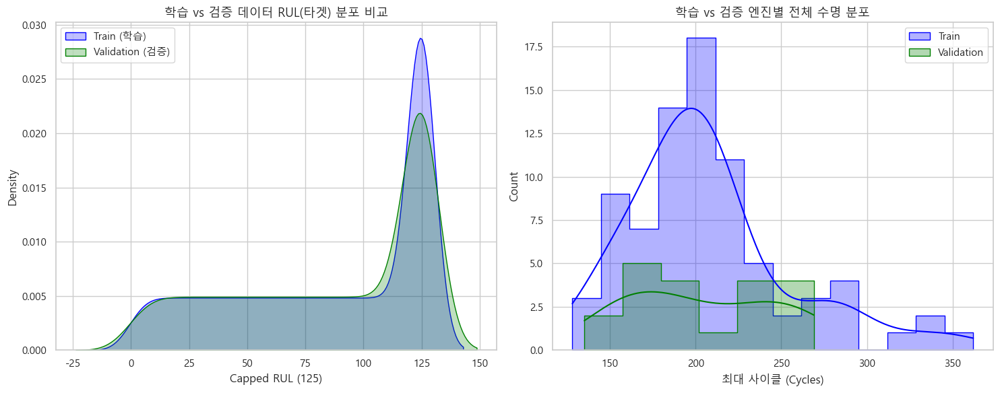

In [104]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. 각 데이터셋의 RUL 분포 비교
plt.figure(figsize=(15, 6))

plt.subplot(1, 2, 1)
sns.kdeplot(df_ml_train['RUL_capped'], label='Train (학습)', fill=True, color='blue')
sns.kdeplot(df_ml_val['RUL_capped'], label='Validation (검증)', fill=True, color='green')
plt.title('학습 vs 검증 데이터 RUL(타겟) 분포 비교', fontsize=13)
plt.xlabel('Capped RUL (125)')
plt.legend()

# 2. 엔진별 최대 수명(Max Cycle) 분포 비교
# 데이터셋이 편향되게 나뉘었는지 확인하는 용도 ㅋ
train_max_cycles = df_ml_train.groupby('unit_nr')['time_cycles'].max()
val_max_cycles = df_ml_val.groupby('unit_nr')['time_cycles'].max()

plt.subplot(1, 2, 2)
sns.histplot(train_max_cycles, label='Train', kde=True, color='blue', element="step", alpha=0.3)
sns.histplot(val_max_cycles, label='Validation', kde=True, color='green', element="step", alpha=0.3)
plt.title('학습 vs 검증 엔진별 전체 수명 분포', fontsize=13)
plt.xlabel('최대 사이클 (Cycles)')
plt.legend()

plt.tight_layout()
plt.show()